# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.991

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9926, 0.9930488993413746)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: vo1qaemz
Name: generous-brook-119
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/vo1qaemz
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120406-vo1qaemz/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2543,3288,9412
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2543,2556,1711,3408,1654,3371
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4479,10764
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 662,821,2327
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 662,646,397,882,395,828
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1105,2705
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:15<2:35:30, 15.58s/it]

Epoch 1/600:   0%|▎                                                                                                                                                           | 1/600 [00:15<2:35:30, 15.58s/it, v_num=mz_1, total_loss_train=61.6, kl_local_train=32.1]

Epoch 2/600:   0%|▎                                                                                                                                                           | 1/600 [00:15<2:35:30, 15.58s/it, v_num=mz_1, total_loss_train=61.6, kl_local_train=32.1]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:28<2:21:28, 14.19s/it, v_num=mz_1, total_loss_train=61.6, kl_local_train=32.1]

Epoch 2/600:   0%|▌                                                                                                                                                             | 2/600 [00:28<2:21:28, 14.19s/it, v_num=mz_1, total_loss_train=32.5, kl_local_train=43]

Epoch 3/600:   0%|▌                                                                                                                                                             | 2/600 [00:28<2:21:28, 14.19s/it, v_num=mz_1, total_loss_train=32.5, kl_local_train=43]

Epoch 3/600:   0%|▊                                                                                                                                                             | 3/600 [00:42<2:16:48, 13.75s/it, v_num=mz_1, total_loss_train=32.5, kl_local_train=43]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:42<2:16:48, 13.75s/it, v_num=mz_1, total_loss_train=27.7, kl_local_train=35.8]

Epoch 4/600:   0%|▊                                                                                                                                                           | 3/600 [00:42<2:16:48, 13.75s/it, v_num=mz_1, total_loss_train=27.7, kl_local_train=35.8]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:55<2:14:36, 13.55s/it, v_num=mz_1, total_loss_train=27.7, kl_local_train=35.8]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:55<2:14:36, 13.55s/it, v_num=mz_1, total_loss_train=26.5, kl_local_train=23.2]

Epoch 5/600:   1%|█                                                                                                                                                           | 4/600 [00:55<2:14:36, 13.55s/it, v_num=mz_1, total_loss_train=26.5, kl_local_train=23.2]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:08<2:13:59, 13.51s/it, v_num=mz_1, total_loss_train=26.5, kl_local_train=23.2]

Epoch 5/600:   1%|█▎                                                                                                                                                            | 5/600 [01:08<2:13:59, 13.51s/it, v_num=mz_1, total_loss_train=26, kl_local_train=13.9]

Epoch 6/600:   1%|█▎                                                                                                                                                            | 5/600 [01:10<2:13:59, 13.51s/it, v_num=mz_1, total_loss_train=26, kl_local_train=13.9]

Epoch 6/600:   1%|█▌                                                                                                                                                            | 6/600 [01:22<2:15:46, 13.71s/it, v_num=mz_1, total_loss_train=26, kl_local_train=13.9]

Epoch 6/600:   1%|▏                       | 6/600 [01:22<2:15:46, 13.71s/it, v_num=mz_1, total_loss_train=25.6, kl_local_train=10.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 7/600:   1%|▏                       | 6/600 [01:22<2:15:46, 13.71s/it, v_num=mz_1, total_loss_train=25.6, kl_local_train=10.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 7/600:   1%|▎                       | 7/600 [01:35<2:12:15, 13.38s/it, v_num=mz_1, total_loss_train=25.6, kl_local_train=10.9, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 7/600:   1%|▎                         | 7/600 [01:35<2:12:15, 13.38s/it, v_num=mz_1, total_loss_train=25.1, kl_local_train=12, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 8/600:   1%|▎                         | 7/600 [01:35<2:12:15, 13.38s/it, v_num=mz_1, total_loss_train=25.1, kl_local_train=12, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 8/600:   1%|▎                         | 8/600 [01:48<2:09:46, 13.15s/it, v_num=mz_1, total_loss_train=25.1, kl_local_train=12, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 8/600:   1%|▎                       | 8/600 [01:48<2:09:46, 13.15s/it, v_num=mz_1, total_loss_train=32.5, kl_local_train=13.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 9/600:   1%|▎                       | 8/600 [01:48<2:09:46, 13.15s/it, v_num=mz_1, total_loss_train=32.5, kl_local_train=13.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 9/600:   2%|▎                       | 9/600 [02:00<2:07:57, 12.99s/it, v_num=mz_1, total_loss_train=32.5, kl_local_train=13.2, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 9/600:   2%|▎                       | 9/600 [02:00<2:07:57, 12.99s/it, v_num=mz_1, total_loss_train=39.9, kl_local_train=16.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 10/600:   2%|▎                      | 9/600 [02:00<2:07:57, 12.99s/it, v_num=mz_1, total_loss_train=39.9, kl_local_train=16.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 10/600:   2%|▎                     | 10/600 [02:13<2:07:17, 12.95s/it, v_num=mz_1, total_loss_train=39.9, kl_local_train=16.5, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 10/600:   2%|▎                     | 10/600 [02:13<2:07:17, 12.95s/it, v_num=mz_1, total_loss_train=46.3, kl_local_train=37.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 11/600:   2%|▎                     | 10/600 [02:15<2:07:17, 12.95s/it, v_num=mz_1, total_loss_train=46.3, kl_local_train=37.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 11/600:   2%|▍                     | 11/600 [02:27<2:10:40, 13.31s/it, v_num=mz_1, total_loss_train=46.3, kl_local_train=37.4, metric_mi|status_control_train=0.0213, metric_mi|zone_train=0.00808, metric_mi|time_cat_train=0.0147, metric_mi|mouse_train=0.0366]

Epoch 11/600:   2%|▍                      | 11/600 [02:27<2:10:40, 13.31s/it, v_num=mz_1, total_loss_train=49.6, kl_local_train=72.9, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 12/600:   2%|▍                      | 11/600 [02:27<2:10:40, 13.31s/it, v_num=mz_1, total_loss_train=49.6, kl_local_train=72.9, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 12/600:   2%|▍                      | 12/600 [02:40<2:08:33, 13.12s/it, v_num=mz_1, total_loss_train=49.6, kl_local_train=72.9, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 12/600:   2%|▍                      | 12/600 [02:40<2:08:33, 13.12s/it, v_num=mz_1, total_loss_train=52.4, kl_local_train=99.3, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 13/600:   2%|▍                      | 12/600 [02:40<2:08:33, 13.12s/it, v_num=mz_1, total_loss_train=52.4, kl_local_train=99.3, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 13/600:   2%|▍                      | 13/600 [02:53<2:07:04, 12.99s/it, v_num=mz_1, total_loss_train=52.4, kl_local_train=99.3, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 13/600:   2%|▍                      | 13/600 [02:53<2:07:04, 12.99s/it, v_num=mz_1, total_loss_train=56.9, kl_local_train=98.1, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 14/600:   2%|▍                      | 13/600 [02:53<2:07:04, 12.99s/it, v_num=mz_1, total_loss_train=56.9, kl_local_train=98.1, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 14/600:   2%|▌                      | 14/600 [03:05<2:06:00, 12.90s/it, v_num=mz_1, total_loss_train=56.9, kl_local_train=98.1, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 14/600:   2%|▌                       | 14/600 [03:05<2:06:00, 12.90s/it, v_num=mz_1, total_loss_train=60.8, kl_local_train=108, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 15/600:   2%|▌                       | 14/600 [03:05<2:06:00, 12.90s/it, v_num=mz_1, total_loss_train=60.8, kl_local_train=108, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 15/600:   2%|▌                       | 15/600 [03:18<2:05:40, 12.89s/it, v_num=mz_1, total_loss_train=60.8, kl_local_train=108, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 15/600:   2%|▌                       | 15/600 [03:18<2:05:40, 12.89s/it, v_num=mz_1, total_loss_train=64.1, kl_local_train=134, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 16/600:   2%|▌                       | 15/600 [03:20<2:05:40, 12.89s/it, v_num=mz_1, total_loss_train=64.1, kl_local_train=134, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 16/600:   3%|▋                       | 16/600 [03:32<2:09:02, 13.26s/it, v_num=mz_1, total_loss_train=64.1, kl_local_train=134, metric_mi|status_control_train=0.0623, metric_mi|zone_train=0.0089, metric_mi|time_cat_train=0.0298, metric_mi|mouse_train=0.0467]

Epoch 16/600:   3%|▋                           | 16/600 [03:32<2:09:02, 13.26s/it, v_num=mz_1, total_loss_train=68.1, kl_local_train=148, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 17/600:   3%|▋                           | 16/600 [03:32<2:09:02, 13.26s/it, v_num=mz_1, total_loss_train=68.1, kl_local_train=148, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 17/600:   3%|▊                           | 17/600 [03:45<2:07:10, 13.09s/it, v_num=mz_1, total_loss_train=68.1, kl_local_train=148, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 17/600:   3%|▊                           | 17/600 [03:45<2:07:10, 13.09s/it, v_num=mz_1, total_loss_train=72.1, kl_local_train=156, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 18/600:   3%|▊                           | 17/600 [03:45<2:07:10, 13.09s/it, v_num=mz_1, total_loss_train=72.1, kl_local_train=156, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 18/600:   3%|▊                           | 18/600 [03:58<2:05:45, 12.96s/it, v_num=mz_1, total_loss_train=72.1, kl_local_train=156, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 18/600:   3%|▊                           | 18/600 [03:58<2:05:45, 12.96s/it, v_num=mz_1, total_loss_train=75.9, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 19/600:   3%|▊                           | 18/600 [03:58<2:05:45, 12.96s/it, v_num=mz_1, total_loss_train=75.9, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 19/600:   3%|▉                           | 19/600 [04:10<2:04:47, 12.89s/it, v_num=mz_1, total_loss_train=75.9, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 19/600:   3%|▉                           | 19/600 [04:10<2:04:47, 12.89s/it, v_num=mz_1, total_loss_train=79.9, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 20/600:   3%|▉                           | 19/600 [04:10<2:04:47, 12.89s/it, v_num=mz_1, total_loss_train=79.9, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 20/600:   3%|▉                           | 20/600 [04:23<2:04:12, 12.85s/it, v_num=mz_1, total_loss_train=79.9, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 20/600:   3%|▉                           | 20/600 [04:23<2:04:12, 12.85s/it, v_num=mz_1, total_loss_train=83.9, kl_local_train=142, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 21/600:   3%|▉                           | 20/600 [04:25<2:04:12, 12.85s/it, v_num=mz_1, total_loss_train=83.9, kl_local_train=142, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 21/600:   4%|▉                           | 21/600 [04:37<2:07:57, 13.26s/it, v_num=mz_1, total_loss_train=83.9, kl_local_train=142, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.118]

Epoch 21/600:   4%|█                              | 21/600 [04:37<2:07:57, 13.26s/it, v_num=mz_1, total_loss_train=88, kl_local_train=146, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                              | 21/600 [04:37<2:07:57, 13.26s/it, v_num=mz_1, total_loss_train=88, kl_local_train=146, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█▏                             | 22/600 [04:50<2:07:12, 13.20s/it, v_num=mz_1, total_loss_train=88, kl_local_train=146, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                            | 22/600 [04:50<2:07:12, 13.20s/it, v_num=mz_1, total_loss_train=92.1, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                            | 22/600 [04:50<2:07:12, 13.20s/it, v_num=mz_1, total_loss_train=92.1, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                            | 23/600 [05:03<2:06:10, 13.12s/it, v_num=mz_1, total_loss_train=92.1, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                            | 23/600 [05:03<2:06:10, 13.12s/it, v_num=mz_1, total_loss_train=96.5, kl_local_train=141, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█                            | 23/600 [05:03<2:06:10, 13.12s/it, v_num=mz_1, total_loss_train=96.5, kl_local_train=141, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█▏                           | 24/600 [05:16<2:05:33, 13.08s/it, v_num=mz_1, total_loss_train=96.5, kl_local_train=141, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█▏                            | 24/600 [05:16<2:05:33, 13.08s/it, v_num=mz_1, total_loss_train=101, kl_local_train=144, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▏                            | 24/600 [05:16<2:05:33, 13.08s/it, v_num=mz_1, total_loss_train=101, kl_local_train=144, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▎                            | 25/600 [05:29<2:05:18, 13.08s/it, v_num=mz_1, total_loss_train=101, kl_local_train=144, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▎                            | 25/600 [05:29<2:05:18, 13.08s/it, v_num=mz_1, total_loss_train=105, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▎                            | 25/600 [05:31<2:05:18, 13.08s/it, v_num=mz_1, total_loss_train=105, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▎                            | 26/600 [05:44<2:08:56, 13.48s/it, v_num=mz_1, total_loss_train=105, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▎                            | 26/600 [05:44<2:08:56, 13.48s/it, v_num=mz_1, total_loss_train=109, kl_local_train=146, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 27/600:   4%|█▎                            | 26/600 [05:44<2:08:56, 13.48s/it, v_num=mz_1, total_loss_train=109, kl_local_train=146, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 27/600:   4%|█▎                            | 27/600 [05:57<2:07:00, 13.30s/it, v_num=mz_1, total_loss_train=109, kl_local_train=146, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 27/600:   4%|█▎                            | 27/600 [05:57<2:07:00, 13.30s/it, v_num=mz_1, total_loss_train=113, kl_local_train=147, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 28/600:   4%|█▎                            | 27/600 [05:57<2:07:00, 13.30s/it, v_num=mz_1, total_loss_train=113, kl_local_train=147, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 28/600:   5%|█▍                            | 28/600 [06:10<2:06:14, 13.24s/it, v_num=mz_1, total_loss_train=113, kl_local_train=147, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 28/600:   5%|█▍                            | 28/600 [06:10<2:06:14, 13.24s/it, v_num=mz_1, total_loss_train=118, kl_local_train=148, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 29/600:   5%|█▍                            | 28/600 [06:10<2:06:14, 13.24s/it, v_num=mz_1, total_loss_train=118, kl_local_train=148, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 29/600:   5%|█▍                            | 29/600 [06:23<2:05:42, 13.21s/it, v_num=mz_1, total_loss_train=118, kl_local_train=148, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 29/600:   5%|█▍                            | 29/600 [06:23<2:05:42, 13.21s/it, v_num=mz_1, total_loss_train=122, kl_local_train=146, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 30/600:   5%|█▍                            | 29/600 [06:23<2:05:42, 13.21s/it, v_num=mz_1, total_loss_train=122, kl_local_train=146, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 30/600:   5%|█▌                            | 30/600 [06:36<2:05:25, 13.20s/it, v_num=mz_1, total_loss_train=122, kl_local_train=146, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 30/600:   5%|█▌                            | 30/600 [06:36<2:05:25, 13.20s/it, v_num=mz_1, total_loss_train=126, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 31/600:   5%|█▌                            | 30/600 [06:38<2:05:25, 13.20s/it, v_num=mz_1, total_loss_train=126, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 31/600:   5%|█▌                            | 31/600 [06:51<2:09:42, 13.68s/it, v_num=mz_1, total_loss_train=126, kl_local_train=150, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 31/600:   5%|█▌                            | 31/600 [06:51<2:09:42, 13.68s/it, v_num=mz_1, total_loss_train=130, kl_local_train=149, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 32/600:   5%|█▌                            | 31/600 [06:51<2:09:42, 13.68s/it, v_num=mz_1, total_loss_train=130, kl_local_train=149, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 32/600:   5%|█▌                            | 32/600 [07:04<2:08:47, 13.61s/it, v_num=mz_1, total_loss_train=130, kl_local_train=149, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 32/600:   5%|█▌                            | 32/600 [07:04<2:08:47, 13.61s/it, v_num=mz_1, total_loss_train=134, kl_local_train=147, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 33/600:   5%|█▌                            | 32/600 [07:04<2:08:47, 13.61s/it, v_num=mz_1, total_loss_train=134, kl_local_train=147, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 33/600:   6%|█▋                            | 33/600 [07:18<2:07:58, 13.54s/it, v_num=mz_1, total_loss_train=134, kl_local_train=147, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 33/600:   6%|█▋                            | 33/600 [07:18<2:07:58, 13.54s/it, v_num=mz_1, total_loss_train=139, kl_local_train=148, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 34/600:   6%|█▋                            | 33/600 [07:18<2:07:58, 13.54s/it, v_num=mz_1, total_loss_train=139, kl_local_train=148, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 34/600:   6%|█▋                            | 34/600 [07:31<2:07:14, 13.49s/it, v_num=mz_1, total_loss_train=139, kl_local_train=148, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 34/600:   6%|█▋                            | 34/600 [07:31<2:07:14, 13.49s/it, v_num=mz_1, total_loss_train=143, kl_local_train=151, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 35/600:   6%|█▋                            | 34/600 [07:31<2:07:14, 13.49s/it, v_num=mz_1, total_loss_train=143, kl_local_train=151, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 35/600:   6%|█▊                            | 35/600 [07:45<2:07:00, 13.49s/it, v_num=mz_1, total_loss_train=143, kl_local_train=151, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 35/600:   6%|█▊                            | 35/600 [07:45<2:07:00, 13.49s/it, v_num=mz_1, total_loss_train=147, kl_local_train=150, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 36/600:   6%|█▊                            | 35/600 [07:46<2:07:00, 13.49s/it, v_num=mz_1, total_loss_train=147, kl_local_train=150, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 36/600:   6%|█▊                            | 36/600 [08:00<2:11:00, 13.94s/it, v_num=mz_1, total_loss_train=147, kl_local_train=150, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.144]

Epoch 36/600:   6%|█▊                            | 36/600 [08:00<2:11:00, 13.94s/it, v_num=mz_1, total_loss_train=152, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|█▊                            | 36/600 [08:00<2:11:00, 13.94s/it, v_num=mz_1, total_loss_train=152, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|█▊                            | 37/600 [08:13<2:09:31, 13.80s/it, v_num=mz_1, total_loss_train=152, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 37/600:   6%|█▊                            | 37/600 [08:13<2:09:31, 13.80s/it, v_num=mz_1, total_loss_train=156, kl_local_train=151, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|█▊                            | 37/600 [08:13<2:09:31, 13.80s/it, v_num=mz_1, total_loss_train=156, kl_local_train=151, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|█▉                            | 38/600 [08:27<2:08:29, 13.72s/it, v_num=mz_1, total_loss_train=156, kl_local_train=151, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 38/600:   6%|█▉                            | 38/600 [08:27<2:08:29, 13.72s/it, v_num=mz_1, total_loss_train=160, kl_local_train=153, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|█▉                            | 38/600 [08:27<2:08:29, 13.72s/it, v_num=mz_1, total_loss_train=160, kl_local_train=153, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|█▉                            | 39/600 [08:40<2:07:40, 13.66s/it, v_num=mz_1, total_loss_train=160, kl_local_train=153, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 39/600:   6%|█▉                            | 39/600 [08:40<2:07:40, 13.66s/it, v_num=mz_1, total_loss_train=164, kl_local_train=152, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 40/600:   6%|█▉                            | 39/600 [08:40<2:07:40, 13.66s/it, v_num=mz_1, total_loss_train=164, kl_local_train=152, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 40/600:   7%|██                            | 40/600 [08:54<2:07:24, 13.65s/it, v_num=mz_1, total_loss_train=164, kl_local_train=152, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 40/600:   7%|██                            | 40/600 [08:54<2:07:24, 13.65s/it, v_num=mz_1, total_loss_train=168, kl_local_train=150, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|██                            | 40/600 [08:55<2:07:24, 13.65s/it, v_num=mz_1, total_loss_train=168, kl_local_train=150, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|██                            | 41/600 [09:09<2:10:17, 13.98s/it, v_num=mz_1, total_loss_train=168, kl_local_train=150, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 41/600:   7%|██                            | 41/600 [09:09<2:10:17, 13.98s/it, v_num=mz_1, total_loss_train=173, kl_local_train=152, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 42/600:   7%|██                            | 41/600 [09:09<2:10:17, 13.98s/it, v_num=mz_1, total_loss_train=173, kl_local_train=152, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 42/600:   7%|██                            | 42/600 [09:22<2:07:52, 13.75s/it, v_num=mz_1, total_loss_train=173, kl_local_train=152, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 42/600:   7%|██                            | 42/600 [09:22<2:07:52, 13.75s/it, v_num=mz_1, total_loss_train=177, kl_local_train=149, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 43/600:   7%|██                            | 42/600 [09:22<2:07:52, 13.75s/it, v_num=mz_1, total_loss_train=177, kl_local_train=149, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 43/600:   7%|██▏                           | 43/600 [09:35<2:06:13, 13.60s/it, v_num=mz_1, total_loss_train=177, kl_local_train=149, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 43/600:   7%|██▏                           | 43/600 [09:35<2:06:13, 13.60s/it, v_num=mz_1, total_loss_train=181, kl_local_train=151, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 44/600:   7%|██▏                           | 43/600 [09:35<2:06:13, 13.60s/it, v_num=mz_1, total_loss_train=181, kl_local_train=151, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 44/600:   7%|██▏                           | 44/600 [09:49<2:06:10, 13.62s/it, v_num=mz_1, total_loss_train=181, kl_local_train=151, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 44/600:   7%|██▏                           | 44/600 [09:49<2:06:10, 13.62s/it, v_num=mz_1, total_loss_train=185, kl_local_train=150, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 45/600:   7%|██▏                           | 44/600 [09:49<2:06:10, 13.62s/it, v_num=mz_1, total_loss_train=185, kl_local_train=150, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 45/600:   8%|██▎                           | 45/600 [10:03<2:07:16, 13.76s/it, v_num=mz_1, total_loss_train=185, kl_local_train=150, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 45/600:   8%|██▎                           | 45/600 [10:03<2:07:16, 13.76s/it, v_num=mz_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 46/600:   8%|██▎                           | 45/600 [10:04<2:07:16, 13.76s/it, v_num=mz_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 46/600:   8%|██▎                           | 46/600 [10:18<2:11:18, 14.22s/it, v_num=mz_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 46/600:   8%|██▎                           | 46/600 [10:18<2:11:18, 14.22s/it, v_num=mz_1, total_loss_train=194, kl_local_train=149, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|██▎                           | 46/600 [10:18<2:11:18, 14.22s/it, v_num=mz_1, total_loss_train=194, kl_local_train=149, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|██▎                           | 47/600 [10:32<2:10:12, 14.13s/it, v_num=mz_1, total_loss_train=194, kl_local_train=149, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 47/600:   8%|██▎                           | 47/600 [10:32<2:10:12, 14.13s/it, v_num=mz_1, total_loss_train=198, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|██▎                           | 47/600 [10:32<2:10:12, 14.13s/it, v_num=mz_1, total_loss_train=198, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|██▍                           | 48/600 [10:46<2:09:50, 14.11s/it, v_num=mz_1, total_loss_train=198, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 48/600:   8%|██▍                           | 48/600 [10:46<2:09:50, 14.11s/it, v_num=mz_1, total_loss_train=203, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|██▍                           | 48/600 [10:46<2:09:50, 14.11s/it, v_num=mz_1, total_loss_train=203, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|██▍                           | 49/600 [11:00<2:09:43, 14.13s/it, v_num=mz_1, total_loss_train=203, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 49/600:   8%|██▍                           | 49/600 [11:00<2:09:43, 14.13s/it, v_num=mz_1, total_loss_train=207, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|██▍                           | 49/600 [11:00<2:09:43, 14.13s/it, v_num=mz_1, total_loss_train=207, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|██▌                           | 50/600 [11:14<2:09:21, 14.11s/it, v_num=mz_1, total_loss_train=207, kl_local_train=148, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 50/600:   8%|██▌                           | 50/600 [11:14<2:09:21, 14.11s/it, v_num=mz_1, total_loss_train=211, kl_local_train=149, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|██▌                           | 50/600 [11:16<2:09:21, 14.11s/it, v_num=mz_1, total_loss_train=211, kl_local_train=149, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|██▌                           | 51/600 [11:30<2:13:40, 14.61s/it, v_num=mz_1, total_loss_train=211, kl_local_train=149, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 51/600:   8%|██▍                          | 51/600 [11:30<2:13:40, 14.61s/it, v_num=mz_1, total_loss_train=211, kl_local_train=149, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 52/600:   8%|██▍                          | 51/600 [11:30<2:13:40, 14.61s/it, v_num=mz_1, total_loss_train=211, kl_local_train=149, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 52/600:   9%|██▌                          | 52/600 [11:44<2:12:28, 14.50s/it, v_num=mz_1, total_loss_train=211, kl_local_train=149, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 52/600:   9%|██▌                          | 52/600 [11:44<2:12:28, 14.50s/it, v_num=mz_1, total_loss_train=211, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 53/600:   9%|██▌                          | 52/600 [11:44<2:12:28, 14.50s/it, v_num=mz_1, total_loss_train=211, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 53/600:   9%|██▌                          | 53/600 [11:59<2:11:24, 14.41s/it, v_num=mz_1, total_loss_train=211, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 53/600:   9%|██▌                          | 53/600 [11:59<2:11:24, 14.41s/it, v_num=mz_1, total_loss_train=211, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 54/600:   9%|██▌                          | 53/600 [11:59<2:11:24, 14.41s/it, v_num=mz_1, total_loss_train=211, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 54/600:   9%|██▌                          | 54/600 [12:12<2:08:39, 14.14s/it, v_num=mz_1, total_loss_train=211, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 54/600:   9%|██▌                          | 54/600 [12:12<2:08:39, 14.14s/it, v_num=mz_1, total_loss_train=212, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 55/600:   9%|██▌                          | 54/600 [12:12<2:08:39, 14.14s/it, v_num=mz_1, total_loss_train=212, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 55/600:   9%|██▋                          | 55/600 [12:26<2:07:44, 14.06s/it, v_num=mz_1, total_loss_train=212, kl_local_train=148, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 55/600:   9%|██▋                          | 55/600 [12:26<2:07:44, 14.06s/it, v_num=mz_1, total_loss_train=212, kl_local_train=145, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 56/600:   9%|██▋                          | 55/600 [12:27<2:07:44, 14.06s/it, v_num=mz_1, total_loss_train=212, kl_local_train=145, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 56/600:   9%|██▋                          | 56/600 [12:41<2:10:04, 14.35s/it, v_num=mz_1, total_loss_train=212, kl_local_train=145, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 56/600:   9%|██▊                           | 56/600 [12:41<2:10:04, 14.35s/it, v_num=mz_1, total_loss_train=212, kl_local_train=147, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:   9%|██▊                           | 56/600 [12:41<2:10:04, 14.35s/it, v_num=mz_1, total_loss_train=212, kl_local_train=147, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                           | 57/600 [12:54<2:07:37, 14.10s/it, v_num=mz_1, total_loss_train=212, kl_local_train=147, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                           | 57/600 [12:54<2:07:37, 14.10s/it, v_num=mz_1, total_loss_train=212, kl_local_train=145, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                           | 57/600 [12:54<2:07:37, 14.10s/it, v_num=mz_1, total_loss_train=212, kl_local_train=145, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▉                           | 58/600 [13:08<2:07:07, 14.07s/it, v_num=mz_1, total_loss_train=212, kl_local_train=145, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▉                           | 58/600 [13:08<2:07:07, 14.07s/it, v_num=mz_1, total_loss_train=212, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 58/600 [13:08<2:07:07, 14.07s/it, v_num=mz_1, total_loss_train=212, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 59/600 [13:23<2:07:41, 14.16s/it, v_num=mz_1, total_loss_train=212, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 59/600 [13:23<2:07:41, 14.16s/it, v_num=mz_1, total_loss_train=212, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                           | 59/600 [13:23<2:07:41, 14.16s/it, v_num=mz_1, total_loss_train=212, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|███                           | 60/600 [13:38<2:08:57, 14.33s/it, v_num=mz_1, total_loss_train=212, kl_local_train=143, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|███                           | 60/600 [13:38<2:08:57, 14.33s/it, v_num=mz_1, total_loss_train=212, kl_local_train=144, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███                           | 60/600 [13:39<2:08:57, 14.33s/it, v_num=mz_1, total_loss_train=212, kl_local_train=144, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███                           | 61/600 [13:54<2:13:27, 14.86s/it, v_num=mz_1, total_loss_train=212, kl_local_train=144, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███                           | 61/600 [13:54<2:13:27, 14.86s/it, v_num=mz_1, total_loss_train=213, kl_local_train=142, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 62/600:  10%|███                           | 61/600 [13:54<2:13:27, 14.86s/it, v_num=mz_1, total_loss_train=213, kl_local_train=142, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 62/600:  10%|███                           | 62/600 [14:09<2:13:28, 14.89s/it, v_num=mz_1, total_loss_train=213, kl_local_train=142, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 62/600:  10%|███                           | 62/600 [14:09<2:13:28, 14.89s/it, v_num=mz_1, total_loss_train=212, kl_local_train=140, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 63/600:  10%|███                           | 62/600 [14:09<2:13:28, 14.89s/it, v_num=mz_1, total_loss_train=212, kl_local_train=140, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 63/600:  10%|███▏                          | 63/600 [14:24<2:13:24, 14.91s/it, v_num=mz_1, total_loss_train=212, kl_local_train=140, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 63/600:  10%|███▏                          | 63/600 [14:24<2:13:24, 14.91s/it, v_num=mz_1, total_loss_train=212, kl_local_train=138, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 64/600:  10%|███▏                          | 63/600 [14:24<2:13:24, 14.91s/it, v_num=mz_1, total_loss_train=212, kl_local_train=138, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 64/600:  11%|███▏                          | 64/600 [14:38<2:13:11, 14.91s/it, v_num=mz_1, total_loss_train=212, kl_local_train=138, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 64/600:  11%|███▏                          | 64/600 [14:38<2:13:11, 14.91s/it, v_num=mz_1, total_loss_train=212, kl_local_train=138, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 65/600:  11%|███▏                          | 64/600 [14:38<2:13:11, 14.91s/it, v_num=mz_1, total_loss_train=212, kl_local_train=138, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 65/600:  11%|███▎                          | 65/600 [14:53<2:13:05, 14.93s/it, v_num=mz_1, total_loss_train=212, kl_local_train=138, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 65/600:  11%|███▎                          | 65/600 [14:53<2:13:05, 14.93s/it, v_num=mz_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 66/600:  11%|███▎                          | 65/600 [14:55<2:13:05, 14.93s/it, v_num=mz_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 66/600:  11%|███▎                          | 66/600 [15:10<2:16:00, 15.28s/it, v_num=mz_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 66/600:  11%|███▎                          | 66/600 [15:10<2:16:00, 15.28s/it, v_num=mz_1, total_loss_train=213, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 67/600:  11%|███▎                          | 66/600 [15:10<2:16:00, 15.28s/it, v_num=mz_1, total_loss_train=213, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 67/600:  11%|███▎                          | 67/600 [15:24<2:13:52, 15.07s/it, v_num=mz_1, total_loss_train=213, kl_local_train=137, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 67/600:  11%|███▎                          | 67/600 [15:24<2:13:52, 15.07s/it, v_num=mz_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 68/600:  11%|███▎                          | 67/600 [15:24<2:13:52, 15.07s/it, v_num=mz_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 68/600:  11%|███▍                          | 68/600 [15:39<2:13:12, 15.02s/it, v_num=mz_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 68/600:  11%|███▍                          | 68/600 [15:39<2:13:12, 15.02s/it, v_num=mz_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 69/600:  11%|███▍                          | 68/600 [15:39<2:13:12, 15.02s/it, v_num=mz_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 69/600:  12%|███▍                          | 69/600 [15:54<2:12:38, 14.99s/it, v_num=mz_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 69/600:  12%|███▍                          | 69/600 [15:54<2:12:38, 14.99s/it, v_num=mz_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 70/600:  12%|███▍                          | 69/600 [15:54<2:12:38, 14.99s/it, v_num=mz_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 70/600:  12%|███▌                          | 70/600 [16:09<2:13:18, 15.09s/it, v_num=mz_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 70/600:  12%|███▌                          | 70/600 [16:09<2:13:18, 15.09s/it, v_num=mz_1, total_loss_train=213, kl_local_train=132, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 71/600:  12%|███▌                          | 70/600 [16:11<2:13:18, 15.09s/it, v_num=mz_1, total_loss_train=213, kl_local_train=132, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 71/600:  12%|███▌                          | 71/600 [16:26<2:17:05, 15.55s/it, v_num=mz_1, total_loss_train=213, kl_local_train=132, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 71/600:  12%|███▍                         | 71/600 [16:26<2:17:05, 15.55s/it, v_num=mz_1, total_loss_train=213, kl_local_train=131, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|███▍                         | 71/600 [16:26<2:17:05, 15.55s/it, v_num=mz_1, total_loss_train=213, kl_local_train=131, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|███▍                         | 72/600 [16:41<2:15:21, 15.38s/it, v_num=mz_1, total_loss_train=213, kl_local_train=131, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|███▍                         | 72/600 [16:41<2:15:21, 15.38s/it, v_num=mz_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|███▍                         | 72/600 [16:41<2:15:21, 15.38s/it, v_num=mz_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|███▌                         | 73/600 [16:56<2:13:59, 15.26s/it, v_num=mz_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|███▌                         | 73/600 [16:56<2:13:59, 15.26s/it, v_num=mz_1, total_loss_train=213, kl_local_train=129, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|███▌                         | 73/600 [16:56<2:13:59, 15.26s/it, v_num=mz_1, total_loss_train=213, kl_local_train=129, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|███▌                         | 74/600 [17:11<2:12:54, 15.16s/it, v_num=mz_1, total_loss_train=213, kl_local_train=129, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|███▌                         | 74/600 [17:11<2:12:54, 15.16s/it, v_num=mz_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|███▌                         | 74/600 [17:11<2:12:54, 15.16s/it, v_num=mz_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|███▋                         | 75/600 [17:26<2:13:15, 15.23s/it, v_num=mz_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|███▋                         | 75/600 [17:26<2:13:15, 15.23s/it, v_num=mz_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 76/600:  12%|███▋                         | 75/600 [17:28<2:13:15, 15.23s/it, v_num=mz_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 76/600:  13%|███▋                         | 76/600 [17:43<2:16:37, 15.64s/it, v_num=mz_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 76/600:  13%|███▋                         | 76/600 [17:43<2:16:37, 15.64s/it, v_num=mz_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 77/600:  13%|███▋                         | 76/600 [17:43<2:16:37, 15.64s/it, v_num=mz_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 77/600:  13%|███▋                         | 77/600 [17:58<2:14:41, 15.45s/it, v_num=mz_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 77/600:  13%|███▋                         | 77/600 [17:58<2:14:41, 15.45s/it, v_num=mz_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 78/600:  13%|███▋                         | 77/600 [17:58<2:14:41, 15.45s/it, v_num=mz_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 78/600:  13%|███▊                         | 78/600 [18:13<2:12:48, 15.27s/it, v_num=mz_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 78/600:  13%|███▊                         | 78/600 [18:13<2:12:48, 15.27s/it, v_num=mz_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 79/600:  13%|███▊                         | 78/600 [18:13<2:12:48, 15.27s/it, v_num=mz_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 79/600:  13%|███▊                         | 79/600 [18:28<2:11:43, 15.17s/it, v_num=mz_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 79/600:  13%|███▊                         | 79/600 [18:28<2:11:43, 15.17s/it, v_num=mz_1, total_loss_train=214, kl_local_train=126, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 80/600:  13%|███▊                         | 79/600 [18:28<2:11:43, 15.17s/it, v_num=mz_1, total_loss_train=214, kl_local_train=126, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 80/600:  13%|███▊                         | 80/600 [18:43<2:11:53, 15.22s/it, v_num=mz_1, total_loss_train=214, kl_local_train=126, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 80/600:  13%|███▊                         | 80/600 [18:43<2:11:53, 15.22s/it, v_num=mz_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 81/600:  13%|███▊                         | 80/600 [18:45<2:11:53, 15.22s/it, v_num=mz_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 81/600:  14%|███▉                         | 81/600 [18:59<2:14:43, 15.58s/it, v_num=mz_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 81/600:  14%|████▏                          | 81/600 [18:59<2:14:43, 15.58s/it, v_num=mz_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 82/600:  14%|████▏                          | 81/600 [18:59<2:14:43, 15.58s/it, v_num=mz_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 82/600:  14%|████▏                          | 82/600 [19:14<2:12:22, 15.33s/it, v_num=mz_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 82/600:  14%|████▏                          | 82/600 [19:14<2:12:22, 15.33s/it, v_num=mz_1, total_loss_train=215, kl_local_train=123, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 83/600:  14%|████▏                          | 82/600 [19:14<2:12:22, 15.33s/it, v_num=mz_1, total_loss_train=215, kl_local_train=123, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 83/600:  14%|████▎                          | 83/600 [19:29<2:11:07, 15.22s/it, v_num=mz_1, total_loss_train=215, kl_local_train=123, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 83/600:  14%|████▎                          | 83/600 [19:29<2:11:07, 15.22s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 84/600:  14%|████▎                          | 83/600 [19:29<2:11:07, 15.22s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 84/600:  14%|████▎                          | 84/600 [19:44<2:10:06, 15.13s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 84/600:  14%|████▎                          | 84/600 [19:44<2:10:06, 15.13s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 85/600:  14%|████▎                          | 84/600 [19:44<2:10:06, 15.13s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 85/600:  14%|████▍                          | 85/600 [19:59<2:10:32, 15.21s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 85/600:  14%|████▍                          | 85/600 [19:59<2:10:32, 15.21s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 86/600:  14%|████▍                          | 85/600 [20:01<2:10:32, 15.21s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 86/600:  14%|████▍                          | 86/600 [20:16<2:13:58, 15.64s/it, v_num=mz_1, total_loss_train=215, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 86/600:  14%|████▍                          | 86/600 [20:16<2:13:58, 15.64s/it, v_num=mz_1, total_loss_train=215, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 87/600:  14%|████▍                          | 86/600 [20:16<2:13:58, 15.64s/it, v_num=mz_1, total_loss_train=215, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 87/600:  14%|████▍                          | 87/600 [20:31<2:12:04, 15.45s/it, v_num=mz_1, total_loss_train=215, kl_local_train=120, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 87/600:  14%|████▍                          | 87/600 [20:31<2:12:04, 15.45s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 88/600:  14%|████▍                          | 87/600 [20:31<2:12:04, 15.45s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 88/600:  15%|████▌                          | 88/600 [20:46<2:11:29, 15.41s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 88/600:  15%|████▌                          | 88/600 [20:46<2:11:29, 15.41s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 89/600:  15%|████▌                          | 88/600 [20:46<2:11:29, 15.41s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 89/600:  15%|████▌                          | 89/600 [21:01<2:10:20, 15.30s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 89/600:  15%|████▌                          | 89/600 [21:01<2:10:20, 15.30s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 90/600:  15%|████▌                          | 89/600 [21:01<2:10:20, 15.30s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 90/600:  15%|████▋                          | 90/600 [21:17<2:10:28, 15.35s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 90/600:  15%|████▋                          | 90/600 [21:17<2:10:28, 15.35s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 91/600:  15%|████▋                          | 90/600 [21:18<2:10:28, 15.35s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 91/600:  15%|████▋                          | 91/600 [21:33<2:13:33, 15.74s/it, v_num=mz_1, total_loss_train=215, kl_local_train=119, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 91/600:  15%|████▌                         | 91/600 [21:33<2:13:33, 15.74s/it, v_num=mz_1, total_loss_train=216, kl_local_train=118, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 92/600:  15%|████▌                         | 91/600 [21:33<2:13:33, 15.74s/it, v_num=mz_1, total_loss_train=216, kl_local_train=118, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 92/600:  15%|████▌                         | 92/600 [21:49<2:11:35, 15.54s/it, v_num=mz_1, total_loss_train=216, kl_local_train=118, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 92/600:  15%|████▌                         | 92/600 [21:49<2:11:35, 15.54s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 93/600:  15%|████▌                         | 92/600 [21:49<2:11:35, 15.54s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 93/600:  16%|████▋                         | 93/600 [22:04<2:10:07, 15.40s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 93/600:  16%|████▋                         | 93/600 [22:04<2:10:07, 15.40s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 94/600:  16%|████▋                         | 93/600 [22:04<2:10:07, 15.40s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 94/600:  16%|████▋                         | 94/600 [22:19<2:09:01, 15.30s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 94/600:  16%|████▋                         | 94/600 [22:19<2:09:01, 15.30s/it, v_num=mz_1, total_loss_train=216, kl_local_train=117, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 95/600:  16%|████▋                         | 94/600 [22:19<2:09:01, 15.30s/it, v_num=mz_1, total_loss_train=216, kl_local_train=117, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 95/600:  16%|████▊                         | 95/600 [22:34<2:09:17, 15.36s/it, v_num=mz_1, total_loss_train=216, kl_local_train=117, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 95/600:  16%|████▊                         | 95/600 [22:34<2:09:17, 15.36s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 96/600:  16%|████▊                         | 95/600 [22:36<2:09:17, 15.36s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 96/600:  16%|████▊                         | 96/600 [22:51<2:12:23, 15.76s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 96/600:  16%|████▋                        | 96/600 [22:51<2:12:23, 15.76s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 97/600:  16%|████▋                        | 96/600 [22:51<2:12:23, 15.76s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 97/600:  16%|████▋                        | 97/600 [23:06<2:10:20, 15.55s/it, v_num=mz_1, total_loss_train=216, kl_local_train=116, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 97/600:  16%|████▋                        | 97/600 [23:06<2:10:20, 15.55s/it, v_num=mz_1, total_loss_train=216, kl_local_train=114, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 98/600:  16%|████▋                        | 97/600 [23:06<2:10:20, 15.55s/it, v_num=mz_1, total_loss_train=216, kl_local_train=114, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 98/600:  16%|████▋                        | 98/600 [23:21<2:08:50, 15.40s/it, v_num=mz_1, total_loss_train=216, kl_local_train=114, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 98/600:  16%|████▋                        | 98/600 [23:21<2:08:50, 15.40s/it, v_num=mz_1, total_loss_train=216, kl_local_train=113, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 99/600:  16%|████▋                        | 98/600 [23:21<2:08:50, 15.40s/it, v_num=mz_1, total_loss_train=216, kl_local_train=113, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 99/600:  16%|████▊                        | 99/600 [23:36<2:07:39, 15.29s/it, v_num=mz_1, total_loss_train=216, kl_local_train=113, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 99/600:  16%|████▊                        | 99/600 [23:36<2:07:39, 15.29s/it, v_num=mz_1, total_loss_train=217, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 100/600:  16%|████▌                       | 99/600 [23:36<2:07:39, 15.29s/it, v_num=mz_1, total_loss_train=217, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 100/600:  17%|████▌                      | 100/600 [23:51<2:07:52, 15.35s/it, v_num=mz_1, total_loss_train=217, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 100/600:  17%|████▌                      | 100/600 [23:51<2:07:52, 15.35s/it, v_num=mz_1, total_loss_train=216, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 101/600:  17%|████▌                      | 100/600 [23:53<2:07:52, 15.35s/it, v_num=mz_1, total_loss_train=216, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 101/600:  17%|████▌                      | 101/600 [24:08<2:10:44, 15.72s/it, v_num=mz_1, total_loss_train=216, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 101/600:  17%|████▌                      | 101/600 [24:08<2:10:44, 15.72s/it, v_num=mz_1, total_loss_train=217, kl_local_train=112, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 102/600:  17%|████▌                      | 101/600 [24:08<2:10:44, 15.72s/it, v_num=mz_1, total_loss_train=217, kl_local_train=112, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 102/600:  17%|████▌                      | 102/600 [24:23<2:08:31, 15.48s/it, v_num=mz_1, total_loss_train=217, kl_local_train=112, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 102/600:  17%|████▌                      | 102/600 [24:23<2:08:31, 15.48s/it, v_num=mz_1, total_loss_train=217, kl_local_train=110, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 103/600:  17%|████▌                      | 102/600 [24:23<2:08:31, 15.48s/it, v_num=mz_1, total_loss_train=217, kl_local_train=110, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 103/600:  17%|████▋                      | 103/600 [24:38<2:07:03, 15.34s/it, v_num=mz_1, total_loss_train=217, kl_local_train=110, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 103/600:  17%|████▋                      | 103/600 [24:38<2:07:03, 15.34s/it, v_num=mz_1, total_loss_train=217, kl_local_train=111, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 104/600:  17%|████▋                      | 103/600 [24:38<2:07:03, 15.34s/it, v_num=mz_1, total_loss_train=217, kl_local_train=111, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 104/600:  17%|████▋                      | 104/600 [24:53<2:06:00, 15.24s/it, v_num=mz_1, total_loss_train=217, kl_local_train=111, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 104/600:  17%|████▋                      | 104/600 [24:53<2:06:00, 15.24s/it, v_num=mz_1, total_loss_train=217, kl_local_train=111, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 105/600:  17%|████▋                      | 104/600 [24:53<2:06:00, 15.24s/it, v_num=mz_1, total_loss_train=217, kl_local_train=111, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 105/600:  18%|████▋                      | 105/600 [25:08<2:06:15, 15.30s/it, v_num=mz_1, total_loss_train=217, kl_local_train=111, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 105/600:  18%|████▋                      | 105/600 [25:08<2:06:15, 15.30s/it, v_num=mz_1, total_loss_train=217, kl_local_train=110, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 106/600:  18%|████▋                      | 105/600 [25:10<2:06:15, 15.30s/it, v_num=mz_1, total_loss_train=217, kl_local_train=110, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 106/600:  18%|████▊                      | 106/600 [25:25<2:09:15, 15.70s/it, v_num=mz_1, total_loss_train=217, kl_local_train=110, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 106/600:  18%|████▊                      | 106/600 [25:25<2:09:15, 15.70s/it, v_num=mz_1, total_loss_train=217, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 107/600:  18%|████▊                      | 106/600 [25:25<2:09:15, 15.70s/it, v_num=mz_1, total_loss_train=217, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 107/600:  18%|████▊                      | 107/600 [25:40<2:07:37, 15.53s/it, v_num=mz_1, total_loss_train=217, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 107/600:  18%|████▊                      | 107/600 [25:40<2:07:37, 15.53s/it, v_num=mz_1, total_loss_train=217, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 108/600:  18%|████▊                      | 107/600 [25:40<2:07:37, 15.53s/it, v_num=mz_1, total_loss_train=217, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 108/600:  18%|████▊                      | 108/600 [25:55<2:06:03, 15.37s/it, v_num=mz_1, total_loss_train=217, kl_local_train=109, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 108/600:  18%|████▊                      | 108/600 [25:55<2:06:03, 15.37s/it, v_num=mz_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 109/600:  18%|████▊                      | 108/600 [25:55<2:06:03, 15.37s/it, v_num=mz_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 109/600:  18%|████▉                      | 109/600 [26:10<2:04:30, 15.22s/it, v_num=mz_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 109/600:  18%|████▉                      | 109/600 [26:10<2:04:30, 15.22s/it, v_num=mz_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 110/600:  18%|████▉                      | 109/600 [26:10<2:04:30, 15.22s/it, v_num=mz_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 110/600:  18%|████▉                      | 110/600 [26:25<2:04:00, 15.19s/it, v_num=mz_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 110/600:  18%|████▉                      | 110/600 [26:25<2:04:00, 15.19s/it, v_num=mz_1, total_loss_train=218, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 111/600:  18%|████▉                      | 110/600 [26:27<2:04:00, 15.19s/it, v_num=mz_1, total_loss_train=218, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 111/600:  18%|████▉                      | 111/600 [26:42<2:07:06, 15.60s/it, v_num=mz_1, total_loss_train=218, kl_local_train=107, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 111/600:  18%|█████▏                      | 111/600 [26:42<2:07:06, 15.60s/it, v_num=mz_1, total_loss_train=218, kl_local_train=108, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 112/600:  18%|█████▏                      | 111/600 [26:42<2:07:06, 15.60s/it, v_num=mz_1, total_loss_train=218, kl_local_train=108, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 112/600:  19%|█████▏                      | 112/600 [26:57<2:05:27, 15.43s/it, v_num=mz_1, total_loss_train=218, kl_local_train=108, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 112/600:  19%|█████▏                      | 112/600 [26:57<2:05:27, 15.43s/it, v_num=mz_1, total_loss_train=218, kl_local_train=106, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 113/600:  19%|█████▏                      | 112/600 [26:57<2:05:27, 15.43s/it, v_num=mz_1, total_loss_train=218, kl_local_train=106, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 113/600:  19%|█████▎                      | 113/600 [27:12<2:04:02, 15.28s/it, v_num=mz_1, total_loss_train=218, kl_local_train=106, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 113/600:  19%|█████▎                      | 113/600 [27:12<2:04:02, 15.28s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 114/600:  19%|█████▎                      | 113/600 [27:12<2:04:02, 15.28s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 114/600:  19%|█████▎                      | 114/600 [27:27<2:03:03, 15.19s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 114/600:  19%|█████▎                      | 114/600 [27:27<2:03:03, 15.19s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 115/600:  19%|█████▎                      | 114/600 [27:27<2:03:03, 15.19s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 115/600:  19%|█████▎                      | 115/600 [27:42<2:03:16, 15.25s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 115/600:  19%|█████▎                      | 115/600 [27:42<2:03:16, 15.25s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 116/600:  19%|█████▎                      | 115/600 [27:44<2:03:16, 15.25s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 116/600:  19%|█████▍                      | 116/600 [27:59<2:06:09, 15.64s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 116/600:  19%|█████▍                      | 116/600 [27:59<2:06:09, 15.64s/it, v_num=mz_1, total_loss_train=218, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 117/600:  19%|█████▍                      | 116/600 [27:59<2:06:09, 15.64s/it, v_num=mz_1, total_loss_train=218, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 117/600:  20%|█████▍                      | 117/600 [28:14<2:04:12, 15.43s/it, v_num=mz_1, total_loss_train=218, kl_local_train=106, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 117/600:  20%|█████▍                      | 117/600 [28:14<2:04:12, 15.43s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 118/600:  20%|█████▍                      | 117/600 [28:14<2:04:12, 15.43s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 118/600:  20%|█████▌                      | 118/600 [28:28<2:02:44, 15.28s/it, v_num=mz_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 118/600:  20%|█████▌                      | 118/600 [28:28<2:02:44, 15.28s/it, v_num=mz_1, total_loss_train=219, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 119/600:  20%|█████▌                      | 118/600 [28:29<2:02:44, 15.28s/it, v_num=mz_1, total_loss_train=219, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 119/600:  20%|█████▌                      | 119/600 [28:43<2:01:27, 15.15s/it, v_num=mz_1, total_loss_train=219, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 119/600:  20%|█████▌                      | 119/600 [28:43<2:01:27, 15.15s/it, v_num=mz_1, total_loss_train=219, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 120/600:  20%|█████▌                      | 119/600 [28:43<2:01:27, 15.15s/it, v_num=mz_1, total_loss_train=219, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 120/600:  20%|█████▌                      | 120/600 [28:59<2:01:37, 15.20s/it, v_num=mz_1, total_loss_train=219, kl_local_train=104, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 120/600:  20%|█████▌                      | 120/600 [28:59<2:01:37, 15.20s/it, v_num=mz_1, total_loss_train=219, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 121/600:  20%|█████▌                      | 120/600 [29:00<2:01:37, 15.20s/it, v_num=mz_1, total_loss_train=219, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 121/600:  20%|█████▋                      | 121/600 [29:15<2:04:04, 15.54s/it, v_num=mz_1, total_loss_train=219, kl_local_train=103, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 121/600:  20%|█████▍                     | 121/600 [29:15<2:04:04, 15.54s/it, v_num=mz_1, total_loss_train=219, kl_local_train=103, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 122/600:  20%|█████▍                     | 121/600 [29:15<2:04:04, 15.54s/it, v_num=mz_1, total_loss_train=219, kl_local_train=103, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 122/600:  20%|█████▍                     | 122/600 [29:30<2:02:13, 15.34s/it, v_num=mz_1, total_loss_train=219, kl_local_train=103, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 122/600:  20%|█████▍                     | 122/600 [29:30<2:02:13, 15.34s/it, v_num=mz_1, total_loss_train=219, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 123/600:  20%|█████▍                     | 122/600 [29:30<2:02:13, 15.34s/it, v_num=mz_1, total_loss_train=219, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 123/600:  20%|█████▌                     | 123/600 [29:45<2:00:39, 15.18s/it, v_num=mz_1, total_loss_train=219, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 123/600:  20%|█████▌                     | 123/600 [29:45<2:00:39, 15.18s/it, v_num=mz_1, total_loss_train=219, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 124/600:  20%|█████▌                     | 123/600 [29:45<2:00:39, 15.18s/it, v_num=mz_1, total_loss_train=219, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 124/600:  21%|█████▌                     | 124/600 [29:59<1:59:31, 15.07s/it, v_num=mz_1, total_loss_train=219, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 124/600:  21%|█████▌                     | 124/600 [29:59<1:59:31, 15.07s/it, v_num=mz_1, total_loss_train=220, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 125/600:  21%|█████▌                     | 124/600 [29:59<1:59:31, 15.07s/it, v_num=mz_1, total_loss_train=220, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 125/600:  21%|█████▋                     | 125/600 [30:15<1:59:51, 15.14s/it, v_num=mz_1, total_loss_train=220, kl_local_train=102, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 125/600:  21%|█████▋                     | 125/600 [30:15<1:59:51, 15.14s/it, v_num=mz_1, total_loss_train=220, kl_local_train=101, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 126/600:  21%|█████▋                     | 125/600 [30:16<1:59:51, 15.14s/it, v_num=mz_1, total_loss_train=220, kl_local_train=101, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 126/600:  21%|█████▋                     | 126/600 [30:31<2:02:53, 15.56s/it, v_num=mz_1, total_loss_train=220, kl_local_train=101, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.138]

Epoch 126/600:  21%|█████▋                     | 126/600 [30:31<2:02:53, 15.56s/it, v_num=mz_1, total_loss_train=220, kl_local_train=101, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 127/600:  21%|█████▋                     | 126/600 [30:31<2:02:53, 15.56s/it, v_num=mz_1, total_loss_train=220, kl_local_train=101, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 127/600:  21%|█████▋                     | 127/600 [30:46<2:01:29, 15.41s/it, v_num=mz_1, total_loss_train=220, kl_local_train=101, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 127/600:  21%|█████▌                    | 127/600 [30:46<2:01:29, 15.41s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 128/600:  21%|█████▌                    | 127/600 [30:46<2:01:29, 15.41s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 128/600:  21%|█████▌                    | 128/600 [31:01<1:59:59, 15.25s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 128/600:  21%|█████▌                    | 128/600 [31:01<1:59:59, 15.25s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 129/600:  21%|█████▌                    | 128/600 [31:01<1:59:59, 15.25s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 129/600:  22%|█████▌                    | 129/600 [31:16<1:58:48, 15.14s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 129/600:  22%|█████▌                    | 129/600 [31:16<1:58:48, 15.14s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 130/600:  22%|█████▌                    | 129/600 [31:16<1:58:48, 15.14s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 130/600:  22%|█████▋                    | 130/600 [31:31<1:57:41, 15.02s/it, v_num=mz_1, total_loss_train=220, kl_local_train=99.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 130/600:  22%|█████▋                    | 130/600 [31:31<1:57:41, 15.02s/it, v_num=mz_1, total_loss_train=220, kl_local_train=98.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 131/600:  22%|█████▋                    | 130/600 [31:33<1:57:41, 15.02s/it, v_num=mz_1, total_loss_train=220, kl_local_train=98.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 131/600:  22%|█████▋                    | 131/600 [31:47<2:00:54, 15.47s/it, v_num=mz_1, total_loss_train=220, kl_local_train=98.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 131/600:  22%|█████▋                    | 131/600 [31:47<2:00:54, 15.47s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.5, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 132/600:  22%|█████▋                    | 131/600 [31:47<2:00:54, 15.47s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.5, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 132/600:  22%|█████▋                    | 132/600 [32:02<1:59:15, 15.29s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.5, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 132/600:  22%|█████▋                    | 132/600 [32:02<1:59:15, 15.29s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 133/600:  22%|█████▋                    | 132/600 [32:02<1:59:15, 15.29s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 133/600:  22%|█████▊                    | 133/600 [32:17<1:57:57, 15.16s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 133/600:  22%|█████▊                    | 133/600 [32:17<1:57:57, 15.16s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 134/600:  22%|█████▊                    | 133/600 [32:17<1:57:57, 15.16s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 134/600:  22%|█████▊                    | 134/600 [32:32<1:56:54, 15.05s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 134/600:  22%|█████▊                    | 134/600 [32:32<1:56:54, 15.05s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 135/600:  22%|█████▊                    | 134/600 [32:32<1:56:54, 15.05s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 135/600:  22%|█████▊                    | 135/600 [32:47<1:57:14, 15.13s/it, v_num=mz_1, total_loss_train=220, kl_local_train=97.4, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 135/600:  22%|█████▊                    | 135/600 [32:47<1:57:14, 15.13s/it, v_num=mz_1, total_loss_train=220, kl_local_train=96.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 136/600:  22%|█████▊                    | 135/600 [32:49<1:57:14, 15.13s/it, v_num=mz_1, total_loss_train=220, kl_local_train=96.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 136/600:  23%|█████▉                    | 136/600 [33:04<2:00:09, 15.54s/it, v_num=mz_1, total_loss_train=220, kl_local_train=96.6, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 136/600:  23%|█████▉                    | 136/600 [33:04<2:00:09, 15.54s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 137/600:  23%|█████▉                    | 136/600 [33:04<2:00:09, 15.54s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 137/600:  23%|█████▉                    | 137/600 [33:19<1:58:17, 15.33s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 137/600:  23%|█████▉                    | 137/600 [33:19<1:58:17, 15.33s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 138/600:  23%|█████▉                    | 137/600 [33:19<1:58:17, 15.33s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 138/600:  23%|█████▉                    | 138/600 [33:33<1:56:56, 15.19s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 138/600:  23%|█████▉                    | 138/600 [33:33<1:56:56, 15.19s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 139/600:  23%|█████▉                    | 138/600 [33:33<1:56:56, 15.19s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 139/600:  23%|██████                    | 139/600 [33:48<1:56:02, 15.10s/it, v_num=mz_1, total_loss_train=221, kl_local_train=96.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 139/600:  23%|██████                    | 139/600 [33:48<1:56:02, 15.10s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 140/600:  23%|██████                    | 139/600 [33:48<1:56:02, 15.10s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 140/600:  23%|██████                    | 140/600 [34:04<1:56:14, 15.16s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 140/600:  23%|██████                    | 140/600 [34:04<1:56:14, 15.16s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 141/600:  23%|██████                    | 140/600 [34:05<1:56:14, 15.16s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 141/600:  24%|██████                    | 141/600 [34:20<1:59:02, 15.56s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 141/600:  24%|██████                    | 141/600 [34:20<1:59:02, 15.56s/it, v_num=mz_1, total_loss_train=221, kl_local_train=94.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 142/600:  24%|██████                    | 141/600 [34:20<1:59:02, 15.56s/it, v_num=mz_1, total_loss_train=221, kl_local_train=94.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 142/600:  24%|██████▏                   | 142/600 [34:35<1:57:08, 15.35s/it, v_num=mz_1, total_loss_train=221, kl_local_train=94.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 142/600:  24%|██████▋                     | 142/600 [34:35<1:57:08, 15.35s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 143/600:  24%|██████▋                     | 142/600 [34:35<1:57:08, 15.35s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 143/600:  24%|██████▋                     | 143/600 [34:50<1:55:47, 15.20s/it, v_num=mz_1, total_loss_train=221, kl_local_train=95, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 143/600:  24%|██████▏                   | 143/600 [34:50<1:55:47, 15.20s/it, v_num=mz_1, total_loss_train=221, kl_local_train=94.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 144/600:  24%|██████▏                   | 143/600 [34:50<1:55:47, 15.20s/it, v_num=mz_1, total_loss_train=221, kl_local_train=94.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 144/600:  24%|██████▏                   | 144/600 [35:05<1:54:36, 15.08s/it, v_num=mz_1, total_loss_train=221, kl_local_train=94.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 144/600:  24%|██████▏                   | 144/600 [35:05<1:54:36, 15.08s/it, v_num=mz_1, total_loss_train=221, kl_local_train=93.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 145/600:  24%|██████▏                   | 144/600 [35:05<1:54:36, 15.08s/it, v_num=mz_1, total_loss_train=221, kl_local_train=93.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 145/600:  24%|██████▎                   | 145/600 [35:20<1:54:48, 15.14s/it, v_num=mz_1, total_loss_train=221, kl_local_train=93.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 145/600:  24%|██████▊                     | 145/600 [35:20<1:54:48, 15.14s/it, v_num=mz_1, total_loss_train=222, kl_local_train=93, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 146/600:  24%|██████▊                     | 145/600 [35:22<1:54:48, 15.14s/it, v_num=mz_1, total_loss_train=222, kl_local_train=93, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 146/600:  24%|██████▊                     | 146/600 [35:36<1:57:41, 15.55s/it, v_num=mz_1, total_loss_train=222, kl_local_train=93, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 146/600:  24%|██████▎                   | 146/600 [35:36<1:57:41, 15.55s/it, v_num=mz_1, total_loss_train=222, kl_local_train=93.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 147/600:  24%|██████▎                   | 146/600 [35:36<1:57:41, 15.55s/it, v_num=mz_1, total_loss_train=222, kl_local_train=93.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 147/600:  24%|██████▎                   | 147/600 [35:52<1:56:37, 15.45s/it, v_num=mz_1, total_loss_train=222, kl_local_train=93.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 147/600:  24%|██████▎                   | 147/600 [35:52<1:56:37, 15.45s/it, v_num=mz_1, total_loss_train=222, kl_local_train=92.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 148/600:  24%|██████▎                   | 147/600 [35:52<1:56:37, 15.45s/it, v_num=mz_1, total_loss_train=222, kl_local_train=92.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 148/600:  25%|██████▍                   | 148/600 [36:07<1:55:40, 15.36s/it, v_num=mz_1, total_loss_train=222, kl_local_train=92.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 148/600:  25%|██████▍                   | 148/600 [36:07<1:55:40, 15.36s/it, v_num=mz_1, total_loss_train=222, kl_local_train=92.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 149/600:  25%|██████▍                   | 148/600 [36:07<1:55:40, 15.36s/it, v_num=mz_1, total_loss_train=222, kl_local_train=92.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 149/600:  25%|██████▍                   | 149/600 [36:22<1:54:07, 15.18s/it, v_num=mz_1, total_loss_train=222, kl_local_train=92.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 149/600:  25%|██████▍                   | 149/600 [36:22<1:54:07, 15.18s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 150/600:  25%|██████▍                   | 149/600 [36:22<1:54:07, 15.18s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 150/600:  25%|██████▌                   | 150/600 [36:37<1:54:02, 15.20s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.9, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 150/600:  25%|██████▌                   | 150/600 [36:37<1:54:02, 15.20s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 151/600:  25%|██████▌                   | 150/600 [36:38<1:54:02, 15.20s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 151/600:  25%|██████▌                   | 151/600 [36:53<1:56:26, 15.56s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 151/600:  25%|██████▌                   | 151/600 [36:53<1:56:26, 15.56s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 152/600:  25%|██████▌                   | 151/600 [36:53<1:56:26, 15.56s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 152/600:  25%|██████▌                   | 152/600 [37:08<1:54:30, 15.34s/it, v_num=mz_1, total_loss_train=222, kl_local_train=91.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 152/600:  25%|██████▌                   | 152/600 [37:08<1:54:30, 15.34s/it, v_num=mz_1, total_loss_train=223, kl_local_train=91.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 153/600:  25%|██████▌                   | 152/600 [37:08<1:54:30, 15.34s/it, v_num=mz_1, total_loss_train=223, kl_local_train=91.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 153/600:  26%|██████▋                   | 153/600 [37:23<1:53:00, 15.17s/it, v_num=mz_1, total_loss_train=223, kl_local_train=91.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 153/600:  26%|██████▋                   | 153/600 [37:23<1:53:00, 15.17s/it, v_num=mz_1, total_loss_train=223, kl_local_train=91.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 154/600:  26%|██████▋                   | 153/600 [37:23<1:53:00, 15.17s/it, v_num=mz_1, total_loss_train=223, kl_local_train=91.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 154/600:  26%|██████▋                   | 154/600 [37:38<1:51:52, 15.05s/it, v_num=mz_1, total_loss_train=223, kl_local_train=91.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 154/600:  26%|██████▋                   | 154/600 [37:38<1:51:52, 15.05s/it, v_num=mz_1, total_loss_train=223, kl_local_train=90.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 155/600:  26%|██████▋                   | 154/600 [37:38<1:51:52, 15.05s/it, v_num=mz_1, total_loss_train=223, kl_local_train=90.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 155/600:  26%|██████▋                   | 155/600 [37:52<1:50:35, 14.91s/it, v_num=mz_1, total_loss_train=223, kl_local_train=90.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 155/600:  26%|██████▋                   | 155/600 [37:52<1:50:35, 14.91s/it, v_num=mz_1, total_loss_train=223, kl_local_train=90.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 156/600:  26%|██████▋                   | 155/600 [37:54<1:50:35, 14.91s/it, v_num=mz_1, total_loss_train=223, kl_local_train=90.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 156/600:  26%|██████▊                   | 156/600 [38:09<1:53:45, 15.37s/it, v_num=mz_1, total_loss_train=223, kl_local_train=90.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 156/600:  26%|██████▊                   | 156/600 [38:09<1:53:45, 15.37s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 157/600:  26%|██████▊                   | 156/600 [38:09<1:53:45, 15.37s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 157/600:  26%|██████▊                   | 157/600 [38:23<1:52:05, 15.18s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 157/600:  26%|██████▊                   | 157/600 [38:23<1:52:05, 15.18s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 158/600:  26%|██████▊                   | 157/600 [38:23<1:52:05, 15.18s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 158/600:  26%|██████▊                   | 158/600 [38:38<1:50:54, 15.06s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 158/600:  26%|██████▊                   | 158/600 [38:38<1:50:54, 15.06s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 159/600:  26%|██████▊                   | 158/600 [38:38<1:50:54, 15.06s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 159/600:  26%|██████▉                   | 159/600 [38:53<1:50:01, 14.97s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 159/600:  26%|███████▍                    | 159/600 [38:53<1:50:01, 14.97s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 160/600:  26%|███████▍                    | 159/600 [38:53<1:50:01, 14.97s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 160/600:  27%|███████▍                    | 160/600 [39:08<1:50:20, 15.05s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 160/600:  27%|██████▉                   | 160/600 [39:08<1:50:20, 15.05s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 161/600:  27%|██████▉                   | 160/600 [39:10<1:50:20, 15.05s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 161/600:  27%|██████▉                   | 161/600 [39:24<1:52:44, 15.41s/it, v_num=mz_1, total_loss_train=223, kl_local_train=89.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 161/600:  27%|██████▉                   | 161/600 [39:24<1:52:44, 15.41s/it, v_num=mz_1, total_loss_train=223, kl_local_train=88.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 162/600:  27%|██████▉                   | 161/600 [39:24<1:52:44, 15.41s/it, v_num=mz_1, total_loss_train=223, kl_local_train=88.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 162/600:  27%|███████                   | 162/600 [39:39<1:51:10, 15.23s/it, v_num=mz_1, total_loss_train=223, kl_local_train=88.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 162/600:  27%|███████                   | 162/600 [39:39<1:51:10, 15.23s/it, v_num=mz_1, total_loss_train=223, kl_local_train=87.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 163/600:  27%|███████                   | 162/600 [39:39<1:51:10, 15.23s/it, v_num=mz_1, total_loss_train=223, kl_local_train=87.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 163/600:  27%|███████                   | 163/600 [39:54<1:50:02, 15.11s/it, v_num=mz_1, total_loss_train=223, kl_local_train=87.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 163/600:  27%|███████                   | 163/600 [39:54<1:50:02, 15.11s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 164/600:  27%|███████                   | 163/600 [39:54<1:50:02, 15.11s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 164/600:  27%|███████                   | 164/600 [40:09<1:49:07, 15.02s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 164/600:  27%|███████                   | 164/600 [40:09<1:49:07, 15.02s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 165/600:  27%|███████                   | 164/600 [40:09<1:49:07, 15.02s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 165/600:  28%|███████▏                  | 165/600 [40:24<1:49:08, 15.05s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 165/600:  28%|███████▏                  | 165/600 [40:24<1:49:08, 15.05s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 166/600:  28%|███████▏                  | 165/600 [40:26<1:49:08, 15.05s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 166/600:  28%|███████▏                  | 166/600 [40:40<1:51:49, 15.46s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 166/600:  28%|███████▏                  | 166/600 [40:40<1:51:49, 15.46s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 167/600:  28%|███████▏                  | 166/600 [40:40<1:51:49, 15.46s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 167/600:  28%|███████▏                  | 167/600 [40:55<1:50:25, 15.30s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 167/600:  28%|███████▏                  | 167/600 [40:55<1:50:25, 15.30s/it, v_num=mz_1, total_loss_train=224, kl_local_train=86.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 168/600:  28%|███████▏                  | 167/600 [40:55<1:50:25, 15.30s/it, v_num=mz_1, total_loss_train=224, kl_local_train=86.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 168/600:  28%|███████▎                  | 168/600 [41:10<1:49:15, 15.17s/it, v_num=mz_1, total_loss_train=224, kl_local_train=86.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 168/600:  28%|███████▊                    | 168/600 [41:10<1:49:15, 15.17s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 169/600:  28%|███████▊                    | 168/600 [41:10<1:49:15, 15.17s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 169/600:  28%|███████▉                    | 169/600 [41:25<1:48:10, 15.06s/it, v_num=mz_1, total_loss_train=224, kl_local_train=87, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 169/600:  28%|███████▎                  | 169/600 [41:25<1:48:10, 15.06s/it, v_num=mz_1, total_loss_train=224, kl_local_train=86.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 170/600:  28%|███████▎                  | 169/600 [41:25<1:48:10, 15.06s/it, v_num=mz_1, total_loss_train=224, kl_local_train=86.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 170/600:  28%|███████▎                  | 170/600 [41:40<1:48:20, 15.12s/it, v_num=mz_1, total_loss_train=224, kl_local_train=86.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 170/600:  28%|███████▎                  | 170/600 [41:40<1:48:20, 15.12s/it, v_num=mz_1, total_loss_train=224, kl_local_train=85.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 171/600:  28%|███████▎                  | 170/600 [41:42<1:48:20, 15.12s/it, v_num=mz_1, total_loss_train=224, kl_local_train=85.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 171/600:  28%|███████▍                  | 171/600 [41:56<1:50:37, 15.47s/it, v_num=mz_1, total_loss_train=224, kl_local_train=85.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 171/600:  28%|███████▍                  | 171/600 [41:56<1:50:37, 15.47s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 172/600:  28%|███████▍                  | 171/600 [41:56<1:50:37, 15.47s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 172/600:  29%|███████▍                  | 172/600 [42:11<1:48:53, 15.26s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 172/600:  29%|███████▍                  | 172/600 [42:11<1:48:53, 15.26s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 173/600:  29%|███████▍                  | 172/600 [42:11<1:48:53, 15.26s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 173/600:  29%|███████▍                  | 173/600 [42:26<1:47:36, 15.12s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 173/600:  29%|███████▍                  | 173/600 [42:26<1:47:36, 15.12s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 174/600:  29%|███████▍                  | 173/600 [42:26<1:47:36, 15.12s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 174/600:  29%|███████▌                  | 174/600 [42:41<1:46:40, 15.02s/it, v_num=mz_1, total_loss_train=225, kl_local_train=85.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 174/600:  29%|███████▌                  | 174/600 [42:41<1:46:40, 15.02s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 175/600:  29%|███████▌                  | 174/600 [42:41<1:46:40, 15.02s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 175/600:  29%|███████▌                  | 175/600 [42:56<1:46:52, 15.09s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 175/600:  29%|███████▌                  | 175/600 [42:56<1:46:52, 15.09s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 176/600:  29%|███████▌                  | 175/600 [42:58<1:46:52, 15.09s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 176/600:  29%|███████▋                  | 176/600 [43:12<1:49:06, 15.44s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 176/600:  29%|███████▋                  | 176/600 [43:12<1:49:06, 15.44s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 177/600:  29%|███████▋                  | 176/600 [43:12<1:49:06, 15.44s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 177/600:  30%|███████▋                  | 177/600 [43:27<1:47:14, 15.21s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 177/600:  30%|███████▋                  | 177/600 [43:27<1:47:14, 15.21s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 178/600:  30%|███████▋                  | 177/600 [43:27<1:47:14, 15.21s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 178/600:  30%|███████▋                  | 178/600 [43:42<1:46:08, 15.09s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.9, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 178/600:  30%|███████▋                  | 178/600 [43:42<1:46:08, 15.09s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 179/600:  30%|███████▋                  | 178/600 [43:42<1:46:08, 15.09s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 179/600:  30%|███████▊                  | 179/600 [43:57<1:45:16, 15.00s/it, v_num=mz_1, total_loss_train=225, kl_local_train=84.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 179/600:  30%|███████▊                  | 179/600 [43:57<1:45:16, 15.00s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 180/600:  30%|███████▊                  | 179/600 [43:57<1:45:16, 15.00s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 180/600:  30%|███████▊                  | 180/600 [44:12<1:45:34, 15.08s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 180/600:  30%|███████▊                  | 180/600 [44:12<1:45:34, 15.08s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 181/600:  30%|███████▊                  | 180/600 [44:14<1:45:34, 15.08s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 181/600:  30%|███████▊                  | 181/600 [44:28<1:48:02, 15.47s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 181/600:  30%|███████▊                  | 181/600 [44:28<1:48:02, 15.47s/it, v_num=mz_1, total_loss_train=226, kl_local_train=83.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 182/600:  30%|███████▊                  | 181/600 [44:28<1:48:02, 15.47s/it, v_num=mz_1, total_loss_train=226, kl_local_train=83.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 182/600:  30%|███████▉                  | 182/600 [44:43<1:46:25, 15.28s/it, v_num=mz_1, total_loss_train=226, kl_local_train=83.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 182/600:  30%|███████▉                  | 182/600 [44:43<1:46:25, 15.28s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 183/600:  30%|███████▉                  | 182/600 [44:43<1:46:25, 15.28s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 183/600:  30%|███████▉                  | 183/600 [44:58<1:44:50, 15.08s/it, v_num=mz_1, total_loss_train=225, kl_local_train=83.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 183/600:  30%|███████▉                  | 183/600 [44:58<1:44:50, 15.08s/it, v_num=mz_1, total_loss_train=226, kl_local_train=83.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 184/600:  30%|███████▉                  | 183/600 [44:58<1:44:50, 15.08s/it, v_num=mz_1, total_loss_train=226, kl_local_train=83.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 184/600:  31%|███████▉                  | 184/600 [45:12<1:43:33, 14.94s/it, v_num=mz_1, total_loss_train=226, kl_local_train=83.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 184/600:  31%|███████▉                  | 184/600 [45:12<1:43:33, 14.94s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 185/600:  31%|███████▉                  | 184/600 [45:12<1:43:33, 14.94s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 185/600:  31%|████████                  | 185/600 [45:27<1:43:31, 14.97s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 185/600:  31%|████████                  | 185/600 [45:27<1:43:31, 14.97s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 186/600:  31%|████████                  | 185/600 [45:29<1:43:31, 14.97s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 186/600:  31%|████████                  | 186/600 [45:43<1:45:33, 15.30s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 186/600:  31%|████████▎                  | 186/600 [45:43<1:45:33, 15.30s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 187/600:  31%|████████▎                  | 186/600 [45:43<1:45:33, 15.30s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 187/600:  31%|████████▍                  | 187/600 [45:58<1:43:46, 15.08s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 187/600:  31%|████████▍                  | 187/600 [45:58<1:43:46, 15.08s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 188/600:  31%|████████▍                  | 187/600 [45:58<1:43:46, 15.08s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 188/600:  31%|████████▍                  | 188/600 [46:13<1:42:43, 14.96s/it, v_num=mz_1, total_loss_train=226, kl_local_train=82.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 188/600:  31%|████████▍                  | 188/600 [46:13<1:42:43, 14.96s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 189/600:  31%|████████▍                  | 188/600 [46:13<1:42:43, 14.96s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 189/600:  32%|████████▌                  | 189/600 [46:27<1:41:53, 14.87s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 189/600:  32%|████████▌                  | 189/600 [46:27<1:41:53, 14.87s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 190/600:  32%|████████▌                  | 189/600 [46:27<1:41:53, 14.87s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 190/600:  32%|████████▌                  | 190/600 [46:43<1:42:20, 14.98s/it, v_num=mz_1, total_loss_train=226, kl_local_train=81.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 190/600:  32%|████████▌                  | 190/600 [46:43<1:42:20, 14.98s/it, v_num=mz_1, total_loss_train=226, kl_local_train=80.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 191/600:  32%|████████▌                  | 190/600 [46:44<1:42:20, 14.98s/it, v_num=mz_1, total_loss_train=226, kl_local_train=80.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 191/600:  32%|████████▌                  | 191/600 [46:59<1:44:59, 15.40s/it, v_num=mz_1, total_loss_train=226, kl_local_train=80.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 191/600:  32%|████████▌                  | 191/600 [46:59<1:44:59, 15.40s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 192/600:  32%|████████▌                  | 191/600 [46:59<1:44:59, 15.40s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 192/600:  32%|████████▋                  | 192/600 [47:14<1:43:24, 15.21s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 192/600:  32%|████████▋                  | 192/600 [47:14<1:43:24, 15.21s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 193/600:  32%|████████▋                  | 192/600 [47:14<1:43:24, 15.21s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 193/600:  32%|████████▋                  | 193/600 [47:28<1:42:11, 15.06s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 193/600:  32%|████████▋                  | 193/600 [47:28<1:42:11, 15.06s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 194/600:  32%|████████▋                  | 193/600 [47:28<1:42:11, 15.06s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 194/600:  32%|████████▋                  | 194/600 [47:43<1:41:12, 14.96s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 194/600:  32%|████████▋                  | 194/600 [47:43<1:41:12, 14.96s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 195/600:  32%|████████▋                  | 194/600 [47:43<1:41:12, 14.96s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 195/600:  32%|████████▊                  | 195/600 [47:58<1:41:25, 15.03s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 195/600:  32%|█████████▍                   | 195/600 [47:58<1:41:25, 15.03s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 196/600:  32%|█████████▍                   | 195/600 [48:00<1:41:25, 15.03s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 196/600:  33%|█████████▍                   | 196/600 [48:15<1:43:31, 15.38s/it, v_num=mz_1, total_loss_train=227, kl_local_train=80, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 196/600:  33%|████████▊                  | 196/600 [48:15<1:43:31, 15.38s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 197/600:  33%|████████▊                  | 196/600 [48:15<1:43:31, 15.38s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 197/600:  33%|████████▊                  | 197/600 [48:29<1:40:42, 14.99s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 197/600:  33%|████████▊                  | 197/600 [48:29<1:40:42, 14.99s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 198/600:  33%|████████▊                  | 197/600 [48:29<1:40:42, 14.99s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 198/600:  33%|████████▉                  | 198/600 [48:43<1:38:35, 14.72s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 198/600:  33%|████████▉                  | 198/600 [48:43<1:38:35, 14.72s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 199/600:  33%|████████▉                  | 198/600 [48:43<1:38:35, 14.72s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 199/600:  33%|████████▉                  | 199/600 [48:57<1:37:05, 14.53s/it, v_num=mz_1, total_loss_train=227, kl_local_train=79.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 199/600:  33%|████████▉                  | 199/600 [48:57<1:37:05, 14.53s/it, v_num=mz_1, total_loss_train=227, kl_local_train=78.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 200/600:  33%|████████▉                  | 199/600 [48:57<1:37:05, 14.53s/it, v_num=mz_1, total_loss_train=227, kl_local_train=78.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 200/600:  33%|█████████                  | 200/600 [49:11<1:37:08, 14.57s/it, v_num=mz_1, total_loss_train=227, kl_local_train=78.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 200/600:  33%|█████████                  | 200/600 [49:11<1:37:08, 14.57s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 201/600:  33%|█████████                  | 200/600 [49:13<1:37:08, 14.57s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 201/600:  34%|█████████                  | 201/600 [49:28<1:40:05, 15.05s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 201/600:  34%|█████████                  | 201/600 [49:28<1:40:05, 15.05s/it, v_num=mz_1, total_loss_train=227, kl_local_train=78.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|█████████                  | 201/600 [49:28<1:40:05, 15.05s/it, v_num=mz_1, total_loss_train=227, kl_local_train=78.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|█████████                  | 202/600 [49:42<1:39:02, 14.93s/it, v_num=mz_1, total_loss_train=227, kl_local_train=78.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 202/600:  34%|█████████                  | 202/600 [49:42<1:39:02, 14.93s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|█████████                  | 202/600 [49:42<1:39:02, 14.93s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|█████████▏                 | 203/600 [49:57<1:38:13, 14.85s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 203/600:  34%|█████████▏                 | 203/600 [49:57<1:38:13, 14.85s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|█████████▏                 | 203/600 [49:57<1:38:13, 14.85s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|█████████▏                 | 204/600 [50:11<1:37:11, 14.73s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 204/600:  34%|█████████▏                 | 204/600 [50:11<1:37:11, 14.73s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|█████████▏                 | 204/600 [50:11<1:37:11, 14.73s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|█████████▏                 | 205/600 [50:26<1:36:30, 14.66s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 205/600:  34%|█████████▉                   | 205/600 [50:26<1:36:30, 14.66s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|█████████▉                   | 205/600 [50:27<1:36:30, 14.66s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|█████████▉                   | 206/600 [50:42<1:38:35, 15.01s/it, v_num=mz_1, total_loss_train=228, kl_local_train=78, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 206/600:  34%|████████▉                 | 206/600 [50:42<1:38:35, 15.01s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.4, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|████████▉                 | 206/600 [50:42<1:38:35, 15.01s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.4, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|████████▉                 | 207/600 [50:56<1:37:07, 14.83s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.4, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|████████▉                 | 207/600 [50:56<1:37:07, 14.83s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.7, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 208/600:  34%|████████▉                 | 207/600 [50:56<1:37:07, 14.83s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.7, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 208/600:  35%|█████████                 | 208/600 [51:11<1:36:45, 14.81s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.7, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 208/600:  35%|█████████▋                  | 208/600 [51:11<1:36:45, 14.81s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|█████████▋                  | 208/600 [51:11<1:36:45, 14.81s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|█████████▊                  | 209/600 [51:26<1:36:17, 14.78s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|█████████                 | 209/600 [51:26<1:36:17, 14.78s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.2, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|█████████                 | 209/600 [51:26<1:36:17, 14.78s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.2, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|█████████                 | 210/600 [51:41<1:36:47, 14.89s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.2, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|█████████                 | 210/600 [51:41<1:36:47, 14.89s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|█████████                 | 210/600 [51:42<1:36:47, 14.89s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|█████████▏                | 211/600 [51:57<1:39:08, 15.29s/it, v_num=mz_1, total_loss_train=228, kl_local_train=77.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|█████████▏                | 211/600 [51:57<1:39:08, 15.29s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 212/600:  35%|█████████▏                | 211/600 [51:57<1:39:08, 15.29s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 212/600:  35%|█████████▏                | 212/600 [52:12<1:37:36, 15.09s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 212/600:  35%|█████████▏                | 212/600 [52:12<1:37:36, 15.09s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 213/600:  35%|█████████▏                | 212/600 [52:12<1:37:36, 15.09s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 213/600:  36%|█████████▏                | 213/600 [52:26<1:36:27, 14.96s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 213/600:  36%|█████████▉                  | 213/600 [52:26<1:36:27, 14.96s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 214/600:  36%|█████████▉                  | 213/600 [52:26<1:36:27, 14.96s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 214/600:  36%|█████████▉                  | 214/600 [52:41<1:35:35, 14.86s/it, v_num=mz_1, total_loss_train=228, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 214/600:  36%|█████████▉                  | 214/600 [52:41<1:35:35, 14.86s/it, v_num=mz_1, total_loss_train=229, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 215/600:  36%|█████████▉                  | 214/600 [52:41<1:35:35, 14.86s/it, v_num=mz_1, total_loss_train=229, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 215/600:  36%|██████████                  | 215/600 [52:56<1:35:46, 14.93s/it, v_num=mz_1, total_loss_train=229, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 215/600:  36%|█████████▎                | 215/600 [52:56<1:35:46, 14.93s/it, v_num=mz_1, total_loss_train=229, kl_local_train=76.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 216/600:  36%|█████████▎                | 215/600 [52:58<1:35:46, 14.93s/it, v_num=mz_1, total_loss_train=229, kl_local_train=76.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 216/600:  36%|█████████▎                | 216/600 [53:13<1:38:41, 15.42s/it, v_num=mz_1, total_loss_train=229, kl_local_train=76.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.135]

Epoch 216/600:  36%|█████████▎                | 216/600 [53:13<1:38:41, 15.42s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▎                | 216/600 [53:13<1:38:41, 15.42s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▍                | 217/600 [53:28<1:37:38, 15.30s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 217/600:  36%|█████████▍                | 217/600 [53:28<1:37:38, 15.30s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▍                | 217/600 [53:28<1:37:38, 15.30s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▍                | 218/600 [53:43<1:36:47, 15.20s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 218/600:  36%|█████████▍                | 218/600 [53:43<1:36:47, 15.20s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▍                | 218/600 [53:43<1:36:47, 15.20s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|█████████▍                | 219/600 [53:58<1:36:07, 15.14s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 219/600:  36%|██████████▏                 | 219/600 [53:58<1:36:07, 15.14s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 220/600:  36%|██████████▏                 | 219/600 [53:58<1:36:07, 15.14s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 220/600:  37%|██████████▎                 | 220/600 [54:13<1:35:53, 15.14s/it, v_num=mz_1, total_loss_train=229, kl_local_train=75, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 220/600:  37%|█████████▌                | 220/600 [54:13<1:35:53, 15.14s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|█████████▌                | 220/600 [54:14<1:35:53, 15.14s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|█████████▌                | 221/600 [54:29<1:38:22, 15.57s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 221/600:  37%|█████████▉                 | 221/600 [54:29<1:38:22, 15.57s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 222/600:  37%|█████████▉                 | 221/600 [54:29<1:38:22, 15.57s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 222/600:  37%|█████████▉                 | 222/600 [54:44<1:36:57, 15.39s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 222/600:  37%|█████████▉                 | 222/600 [54:44<1:36:57, 15.39s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 223/600:  37%|█████████▉                 | 222/600 [54:44<1:36:57, 15.39s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 223/600:  37%|██████████                 | 223/600 [54:59<1:35:52, 15.26s/it, v_num=mz_1, total_loss_train=229, kl_local_train=74.7, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 223/600:  37%|██████████                 | 223/600 [54:59<1:35:52, 15.26s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 224/600:  37%|██████████                 | 223/600 [54:59<1:35:52, 15.26s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 224/600:  37%|██████████                 | 224/600 [55:14<1:35:03, 15.17s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 224/600:  37%|██████████                 | 224/600 [55:14<1:35:03, 15.17s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 225/600:  37%|██████████                 | 224/600 [55:14<1:35:03, 15.17s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 225/600:  38%|██████████▏                | 225/600 [55:29<1:34:38, 15.14s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 225/600:  38%|██████████▏                | 225/600 [55:29<1:34:38, 15.14s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 226/600:  38%|██████████▏                | 225/600 [55:31<1:34:38, 15.14s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 226/600:  38%|██████████▏                | 226/600 [55:46<1:37:09, 15.59s/it, v_num=mz_1, total_loss_train=230, kl_local_train=74.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 226/600:  38%|██████████▏                | 226/600 [55:46<1:37:09, 15.59s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 227/600:  38%|██████████▏                | 226/600 [55:46<1:37:09, 15.59s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 227/600:  38%|██████████▏                | 227/600 [56:01<1:35:48, 15.41s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 227/600:  38%|██████████▏                | 227/600 [56:01<1:35:48, 15.41s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 228/600:  38%|██████████▏                | 227/600 [56:01<1:35:48, 15.41s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 228/600:  38%|██████████▎                | 228/600 [56:16<1:34:35, 15.26s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 228/600:  38%|██████████▎                | 228/600 [56:16<1:34:35, 15.26s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 229/600:  38%|██████████▎                | 228/600 [56:16<1:34:35, 15.26s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 229/600:  38%|██████████▎                | 229/600 [56:30<1:33:11, 15.07s/it, v_num=mz_1, total_loss_train=230, kl_local_train=73.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 229/600:  38%|██████████▎                | 229/600 [56:30<1:33:11, 15.07s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 230/600:  38%|██████████▎                | 229/600 [56:30<1:33:11, 15.07s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 230/600:  38%|██████████▎                | 230/600 [56:45<1:31:54, 14.91s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 230/600:  38%|██████████▎                | 230/600 [56:45<1:31:54, 14.91s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 231/600:  38%|██████████▎                | 230/600 [56:47<1:31:54, 14.91s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 231/600:  38%|██████████▍                | 231/600 [57:01<1:33:57, 15.28s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 231/600:  38%|██████████▊                 | 231/600 [57:01<1:33:57, 15.28s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 232/600:  38%|██████████▊                 | 231/600 [57:01<1:33:57, 15.28s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 232/600:  39%|██████████▊                 | 232/600 [57:16<1:32:20, 15.06s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 232/600:  39%|██████████▊                 | 232/600 [57:16<1:32:20, 15.06s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|██████████▊                 | 232/600 [57:16<1:32:20, 15.06s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|██████████▊                 | 233/600 [57:30<1:31:07, 14.90s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 233/600:  39%|██████████▊                 | 233/600 [57:30<1:31:07, 14.90s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▊                 | 233/600 [57:30<1:31:07, 14.90s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▉                 | 234/600 [57:45<1:30:11, 14.79s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 234/600:  39%|██████████▉                 | 234/600 [57:45<1:30:11, 14.79s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▉                 | 234/600 [57:45<1:30:11, 14.79s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▉                 | 235/600 [57:59<1:29:58, 14.79s/it, v_num=mz_1, total_loss_train=230, kl_local_train=72.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 235/600:  39%|██████████▉                 | 235/600 [57:59<1:29:58, 14.79s/it, v_num=mz_1, total_loss_train=230, kl_local_train=71.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|██████████▉                 | 235/600 [58:01<1:29:58, 14.79s/it, v_num=mz_1, total_loss_train=230, kl_local_train=71.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|███████████                 | 236/600 [58:16<1:32:05, 15.18s/it, v_num=mz_1, total_loss_train=230, kl_local_train=71.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 236/600:  39%|██████████▏               | 236/600 [58:16<1:32:05, 15.18s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 237/600:  39%|██████████▏               | 236/600 [58:16<1:32:05, 15.18s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 237/600:  40%|██████████▎               | 237/600 [58:30<1:30:38, 14.98s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 237/600:  40%|██████████▎               | 237/600 [58:30<1:30:38, 14.98s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|██████████▎               | 237/600 [58:30<1:30:38, 14.98s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|██████████▎               | 238/600 [58:45<1:29:35, 14.85s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 238/600:  40%|██████████▎               | 238/600 [58:45<1:29:35, 14.85s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|██████████▎               | 238/600 [58:45<1:29:35, 14.85s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|██████████▎               | 239/600 [58:59<1:28:43, 14.75s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 239/600:  40%|██████████▎               | 239/600 [58:59<1:28:43, 14.75s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|██████████▎               | 239/600 [58:59<1:28:43, 14.75s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|██████████▍               | 240/600 [59:14<1:29:03, 14.84s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.4, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 240/600:  40%|██████████▍               | 240/600 [59:14<1:29:03, 14.84s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|██████████▍               | 240/600 [59:16<1:29:03, 14.84s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|██████████▍               | 241/600 [59:30<1:31:08, 15.23s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 241/600:  40%|███████████▏                | 241/600 [59:30<1:31:08, 15.23s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 242/600:  40%|███████████▏                | 241/600 [59:30<1:31:08, 15.23s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 242/600:  40%|███████████▎                | 242/600 [59:45<1:29:40, 15.03s/it, v_num=mz_1, total_loss_train=231, kl_local_train=71.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 242/600:  40%|███████████▎                | 242/600 [59:45<1:29:40, 15.03s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 243/600:  40%|███████████▎                | 242/600 [59:45<1:29:40, 15.03s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 243/600:  40%|███████████▎                | 243/600 [59:59<1:28:34, 14.89s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 243/600:  40%|███████████▎                | 243/600 [59:59<1:28:34, 14.89s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 244/600:  40%|███████████▎                | 243/600 [59:59<1:28:34, 14.89s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 244/600:  41%|██████████▌               | 244/600 [1:00:14<1:27:45, 14.79s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 244/600:  41%|██████████▌               | 244/600 [1:00:14<1:27:45, 14.79s/it, v_num=mz_1, total_loss_train=232, kl_local_train=70.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 245/600:  41%|██████████▌               | 244/600 [1:00:14<1:27:45, 14.79s/it, v_num=mz_1, total_loss_train=232, kl_local_train=70.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 245/600:  41%|██████████▌               | 245/600 [1:00:29<1:27:20, 14.76s/it, v_num=mz_1, total_loss_train=232, kl_local_train=70.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 245/600:  41%|██████████▌               | 245/600 [1:00:29<1:27:20, 14.76s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 246/600:  41%|██████████▌               | 245/600 [1:00:30<1:27:20, 14.76s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 246/600:  41%|██████████▋               | 246/600 [1:00:45<1:29:33, 15.18s/it, v_num=mz_1, total_loss_train=231, kl_local_train=70.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 246/600:  41%|█████████▊              | 246/600 [1:00:45<1:29:33, 15.18s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|█████████▊              | 246/600 [1:00:45<1:29:33, 15.18s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|█████████▉              | 247/600 [1:00:59<1:28:12, 14.99s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|█████████▉              | 247/600 [1:00:59<1:28:12, 14.99s/it, v_num=mz_1, total_loss_train=231, kl_local_train=69.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|█████████▉              | 247/600 [1:00:59<1:28:12, 14.99s/it, v_num=mz_1, total_loss_train=231, kl_local_train=69.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|█████████▉              | 248/600 [1:01:14<1:27:30, 14.92s/it, v_num=mz_1, total_loss_train=231, kl_local_train=69.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|██████████▋               | 248/600 [1:01:14<1:27:30, 14.92s/it, v_num=mz_1, total_loss_train=232, kl_local_train=70, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 249/600:  41%|██████████▋               | 248/600 [1:01:14<1:27:30, 14.92s/it, v_num=mz_1, total_loss_train=232, kl_local_train=70, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 249/600:  42%|██████████▊               | 249/600 [1:01:29<1:26:48, 14.84s/it, v_num=mz_1, total_loss_train=232, kl_local_train=70, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 249/600:  42%|█████████▉              | 249/600 [1:01:29<1:26:48, 14.84s/it, v_num=mz_1, total_loss_train=231, kl_local_train=69.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|█████████▉              | 249/600 [1:01:29<1:26:48, 14.84s/it, v_num=mz_1, total_loss_train=231, kl_local_train=69.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|██████████              | 250/600 [1:01:44<1:26:58, 14.91s/it, v_num=mz_1, total_loss_train=231, kl_local_train=69.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|██████████              | 250/600 [1:01:44<1:26:58, 14.91s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|██████████              | 250/600 [1:01:45<1:26:58, 14.91s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|██████████              | 251/600 [1:02:00<1:28:44, 15.26s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|██████████              | 251/600 [1:02:00<1:28:44, 15.26s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 252/600:  42%|██████████              | 251/600 [1:02:00<1:28:44, 15.26s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 252/600:  42%|██████████              | 252/600 [1:02:14<1:27:10, 15.03s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 252/600:  42%|██████████              | 252/600 [1:02:14<1:27:10, 15.03s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 253/600:  42%|██████████              | 252/600 [1:02:14<1:27:10, 15.03s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 253/600:  42%|██████████              | 253/600 [1:02:29<1:25:59, 14.87s/it, v_num=mz_1, total_loss_train=232, kl_local_train=69.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 253/600:  42%|██████████              | 253/600 [1:02:29<1:25:59, 14.87s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 254/600:  42%|██████████              | 253/600 [1:02:29<1:25:59, 14.87s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 254/600:  42%|██████████▏             | 254/600 [1:02:43<1:25:05, 14.76s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 254/600:  42%|██████████▏             | 254/600 [1:02:43<1:25:05, 14.76s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 255/600:  42%|██████████▏             | 254/600 [1:02:43<1:25:05, 14.76s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 255/600:  42%|██████████▏             | 255/600 [1:02:58<1:24:12, 14.64s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.3, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 255/600:  42%|██████████▏             | 255/600 [1:02:58<1:24:12, 14.64s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 256/600:  42%|██████████▏             | 255/600 [1:02:59<1:24:12, 14.64s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 256/600:  43%|██████████▏             | 256/600 [1:03:14<1:26:24, 15.07s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.5, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 256/600:  43%|██████████▏             | 256/600 [1:03:14<1:26:24, 15.07s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 257/600:  43%|██████████▏             | 256/600 [1:03:14<1:26:24, 15.07s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 257/600:  43%|██████████▎             | 257/600 [1:03:28<1:25:09, 14.90s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 257/600:  43%|██████████▎             | 257/600 [1:03:28<1:25:09, 14.90s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 258/600:  43%|██████████▎             | 257/600 [1:03:28<1:25:09, 14.90s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 258/600:  43%|██████████▎             | 258/600 [1:03:43<1:24:14, 14.78s/it, v_num=mz_1, total_loss_train=232, kl_local_train=68.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 258/600:  43%|██████████▎             | 258/600 [1:03:43<1:24:14, 14.78s/it, v_num=mz_1, total_loss_train=233, kl_local_train=68.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 259/600:  43%|██████████▎             | 258/600 [1:03:43<1:24:14, 14.78s/it, v_num=mz_1, total_loss_train=233, kl_local_train=68.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 259/600:  43%|██████████▎             | 259/600 [1:03:57<1:23:30, 14.69s/it, v_num=mz_1, total_loss_train=233, kl_local_train=68.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 259/600:  43%|██████████▎             | 259/600 [1:03:57<1:23:30, 14.69s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 260/600:  43%|██████████▎             | 259/600 [1:03:57<1:23:30, 14.69s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 260/600:  43%|██████████▍             | 260/600 [1:04:12<1:23:15, 14.69s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 260/600:  43%|███████████▎              | 260/600 [1:04:12<1:23:15, 14.69s/it, v_num=mz_1, total_loss_train=233, kl_local_train=68, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 261/600:  43%|███████████▎              | 260/600 [1:04:14<1:23:15, 14.69s/it, v_num=mz_1, total_loss_train=233, kl_local_train=68, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 261/600:  44%|███████████▎              | 261/600 [1:04:28<1:25:20, 15.11s/it, v_num=mz_1, total_loss_train=233, kl_local_train=68, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 261/600:  44%|██████████▍             | 261/600 [1:04:28<1:25:20, 15.11s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 262/600:  44%|██████████▍             | 261/600 [1:04:28<1:25:20, 15.11s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 262/600:  44%|██████████▍             | 262/600 [1:04:43<1:24:04, 14.92s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 262/600:  44%|██████████▍             | 262/600 [1:04:43<1:24:04, 14.92s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 263/600:  44%|██████████▍             | 262/600 [1:04:43<1:24:04, 14.92s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 263/600:  44%|██████████▌             | 263/600 [1:04:57<1:23:07, 14.80s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 263/600:  44%|██████████▌             | 263/600 [1:04:57<1:23:07, 14.80s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 264/600:  44%|██████████▌             | 263/600 [1:04:57<1:23:07, 14.80s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 264/600:  44%|██████████▌             | 264/600 [1:05:12<1:22:22, 14.71s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 264/600:  44%|██████████▌             | 264/600 [1:05:12<1:22:22, 14.71s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 265/600:  44%|██████████▌             | 264/600 [1:05:12<1:22:22, 14.71s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 265/600:  44%|██████████▌             | 265/600 [1:05:27<1:22:32, 14.78s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 265/600:  44%|███████████▍              | 265/600 [1:05:27<1:22:32, 14.78s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 266/600:  44%|███████████▍              | 265/600 [1:05:28<1:22:32, 14.78s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 266/600:  44%|███████████▌              | 266/600 [1:05:43<1:24:26, 15.17s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 266/600:  44%|██████████▋             | 266/600 [1:05:43<1:24:26, 15.17s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 266/600 [1:05:43<1:24:26, 15.17s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 267/600 [1:05:57<1:23:06, 14.97s/it, v_num=mz_1, total_loss_train=233, kl_local_train=67.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 267/600 [1:05:57<1:23:06, 14.97s/it, v_num=mz_1, total_loss_train=234, kl_local_train=67.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  44%|██████████▋             | 267/600 [1:05:57<1:23:06, 14.97s/it, v_num=mz_1, total_loss_train=234, kl_local_train=67.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|██████████▋             | 268/600 [1:06:12<1:22:08, 14.85s/it, v_num=mz_1, total_loss_train=234, kl_local_train=67.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|██████████▋             | 268/600 [1:06:12<1:22:08, 14.85s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▋             | 268/600 [1:06:12<1:22:08, 14.85s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:06:26<1:21:41, 14.81s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:06:26<1:21:41, 14.81s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 269/600 [1:06:26<1:21:41, 14.81s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:06:41<1:21:25, 14.80s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:06:41<1:21:25, 14.80s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 270/600 [1:06:43<1:21:25, 14.80s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 271/600 [1:06:57<1:23:24, 15.21s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 271/600 [1:06:57<1:23:24, 15.21s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 272/600:  45%|██████████▊             | 271/600 [1:06:57<1:23:24, 15.21s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 272/600:  45%|██████████▉             | 272/600 [1:07:12<1:21:56, 14.99s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 272/600:  45%|██████████▉             | 272/600 [1:07:12<1:21:56, 14.99s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 273/600:  45%|██████████▉             | 272/600 [1:07:12<1:21:56, 14.99s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 273/600:  46%|██████████▉             | 273/600 [1:07:26<1:20:48, 14.83s/it, v_num=mz_1, total_loss_train=234, kl_local_train=66.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 273/600:  46%|██████████▉             | 273/600 [1:07:26<1:20:48, 14.83s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 274/600:  46%|██████████▉             | 273/600 [1:07:26<1:20:48, 14.83s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 274/600:  46%|██████████▉             | 274/600 [1:07:41<1:19:58, 14.72s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 274/600:  46%|██████████▉             | 274/600 [1:07:41<1:19:58, 14.72s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 275/600:  46%|██████████▉             | 274/600 [1:07:41<1:19:58, 14.72s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 275/600:  46%|███████████             | 275/600 [1:07:56<1:19:47, 14.73s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 275/600:  46%|███████████             | 275/600 [1:07:56<1:19:47, 14.73s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 276/600:  46%|███████████             | 275/600 [1:07:57<1:19:47, 14.73s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 276/600:  46%|███████████             | 276/600 [1:08:12<1:22:19, 15.24s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 276/600:  46%|███████████▌             | 276/600 [1:08:12<1:22:19, 15.24s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|███████████▌             | 276/600 [1:08:12<1:22:19, 15.24s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|███████████▌             | 277/600 [1:08:26<1:20:51, 15.02s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 277/600:  46%|████████████▍              | 277/600 [1:08:26<1:20:51, 15.02s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|████████████▍              | 277/600 [1:08:26<1:20:51, 15.02s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|████████████▌              | 278/600 [1:08:41<1:19:44, 14.86s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 278/600:  46%|███████████▌             | 278/600 [1:08:41<1:19:44, 14.86s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|███████████▌             | 278/600 [1:08:41<1:19:44, 14.86s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|███████████▋             | 279/600 [1:08:55<1:18:51, 14.74s/it, v_num=mz_1, total_loss_train=234, kl_local_train=65.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 279/600:  46%|███████████▋             | 279/600 [1:08:55<1:18:51, 14.74s/it, v_num=mz_1, total_loss_train=234, kl_local_train=64.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 280/600:  46%|███████████▋             | 279/600 [1:08:55<1:18:51, 14.74s/it, v_num=mz_1, total_loss_train=234, kl_local_train=64.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 280/600:  47%|███████████▋             | 280/600 [1:09:10<1:18:56, 14.80s/it, v_num=mz_1, total_loss_train=234, kl_local_train=64.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 280/600:  47%|████████████▌              | 280/600 [1:09:10<1:18:56, 14.80s/it, v_num=mz_1, total_loss_train=235, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|████████████▌              | 280/600 [1:09:12<1:18:56, 14.80s/it, v_num=mz_1, total_loss_train=235, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|████████████▋              | 281/600 [1:09:26<1:20:41, 15.18s/it, v_num=mz_1, total_loss_train=235, kl_local_train=65, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 281/600:  47%|███████████▏            | 281/600 [1:09:26<1:20:41, 15.18s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|███████████▏            | 281/600 [1:09:26<1:20:41, 15.18s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|███████████▎            | 282/600 [1:09:41<1:19:19, 14.97s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 282/600:  47%|███████████▎            | 282/600 [1:09:41<1:19:19, 14.97s/it, v_num=mz_1, total_loss_train=234, kl_local_train=64.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|███████████▎            | 282/600 [1:09:41<1:19:19, 14.97s/it, v_num=mz_1, total_loss_train=234, kl_local_train=64.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|███████████▎            | 283/600 [1:09:55<1:18:17, 14.82s/it, v_num=mz_1, total_loss_train=234, kl_local_train=64.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 283/600:  47%|███████████▎            | 283/600 [1:09:55<1:18:17, 14.82s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|███████████▎            | 283/600 [1:09:55<1:18:17, 14.82s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|███████████▎            | 284/600 [1:10:10<1:17:27, 14.71s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 284/600:  47%|███████████▎            | 284/600 [1:10:10<1:17:27, 14.71s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  47%|███████████▎            | 284/600 [1:10:10<1:17:27, 14.71s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  48%|███████████▍            | 285/600 [1:10:24<1:16:47, 14.63s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 285/600:  48%|███████████▍            | 285/600 [1:10:24<1:16:47, 14.63s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|███████████▍            | 285/600 [1:10:26<1:16:47, 14.63s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|███████████▍            | 286/600 [1:10:40<1:18:47, 15.06s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 286/600:  48%|███████████▍            | 286/600 [1:10:40<1:18:47, 15.06s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 287/600:  48%|███████████▍            | 286/600 [1:10:40<1:18:47, 15.06s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:10:55<1:17:37, 14.88s/it, v_num=mz_1, total_loss_train=235, kl_local_train=64.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:10:55<1:17:37, 14.88s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 288/600:  48%|███████████▍            | 287/600 [1:10:55<1:17:37, 14.88s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 288/600:  48%|███████████▌            | 288/600 [1:11:09<1:16:46, 14.76s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 288/600:  48%|███████████▌            | 288/600 [1:11:09<1:16:46, 14.76s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 289/600:  48%|███████████▌            | 288/600 [1:11:09<1:16:46, 14.76s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 289/600:  48%|███████████▌            | 289/600 [1:11:24<1:16:08, 14.69s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 289/600:  48%|███████████▌            | 289/600 [1:11:24<1:16:08, 14.69s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 290/600:  48%|███████████▌            | 289/600 [1:11:24<1:16:08, 14.69s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 290/600:  48%|███████████▌            | 290/600 [1:11:38<1:15:57, 14.70s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 290/600:  48%|███████████▌            | 290/600 [1:11:38<1:15:57, 14.70s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 291/600:  48%|███████████▌            | 290/600 [1:11:40<1:15:57, 14.70s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 291/600:  48%|███████████▋            | 291/600 [1:11:55<1:18:02, 15.16s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 291/600:  48%|███████████▋            | 291/600 [1:11:55<1:18:02, 15.16s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 292/600:  48%|███████████▋            | 291/600 [1:11:55<1:18:02, 15.16s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 292/600:  49%|███████████▋            | 292/600 [1:12:09<1:16:56, 14.99s/it, v_num=mz_1, total_loss_train=235, kl_local_train=63.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 292/600:  49%|███████████▋            | 292/600 [1:12:09<1:16:56, 14.99s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 293/600:  49%|███████████▋            | 292/600 [1:12:09<1:16:56, 14.99s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 293/600:  49%|███████████▋            | 293/600 [1:12:24<1:16:09, 14.88s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 293/600:  49%|███████████▋            | 293/600 [1:12:24<1:16:09, 14.88s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 294/600:  49%|███████████▋            | 293/600 [1:12:24<1:16:09, 14.88s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 294/600:  49%|███████████▊            | 294/600 [1:12:39<1:15:28, 14.80s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 294/600:  49%|███████████▊            | 294/600 [1:12:39<1:15:28, 14.80s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 295/600:  49%|███████████▊            | 294/600 [1:12:39<1:15:28, 14.80s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 295/600:  49%|███████████▊            | 295/600 [1:12:54<1:15:38, 14.88s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 295/600:  49%|████████████▊             | 295/600 [1:12:54<1:15:38, 14.88s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 296/600:  49%|████████████▊             | 295/600 [1:12:55<1:15:38, 14.88s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 296/600:  49%|████████████▊             | 296/600 [1:13:10<1:18:21, 15.47s/it, v_num=mz_1, total_loss_train=236, kl_local_train=63, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 296/600:  49%|███████████▊            | 296/600 [1:13:10<1:18:21, 15.47s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 297/600:  49%|███████████▊            | 296/600 [1:13:10<1:18:21, 15.47s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 297/600:  50%|███████████▉            | 297/600 [1:13:26<1:17:29, 15.34s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 297/600:  50%|███████████▉            | 297/600 [1:13:26<1:17:29, 15.34s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 298/600:  50%|███████████▉            | 297/600 [1:13:26<1:17:29, 15.34s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 298/600:  50%|███████████▉            | 298/600 [1:13:41<1:16:47, 15.26s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 298/600:  50%|███████████▉            | 298/600 [1:13:41<1:16:47, 15.26s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 299/600:  50%|███████████▉            | 298/600 [1:13:41<1:16:47, 15.26s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:13:56<1:16:09, 15.18s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:13:56<1:16:09, 15.18s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 300/600:  50%|███████████▉            | 299/600 [1:13:56<1:16:09, 15.18s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 300/600:  50%|████████████            | 300/600 [1:14:10<1:15:28, 15.10s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 300/600:  50%|████████████            | 300/600 [1:14:10<1:15:28, 15.10s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 301/600:  50%|████████████            | 300/600 [1:14:12<1:15:28, 15.10s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 301/600:  50%|████████████            | 301/600 [1:14:27<1:17:36, 15.57s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 301/600:  50%|████████████            | 301/600 [1:14:27<1:17:36, 15.57s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 302/600:  50%|████████████            | 301/600 [1:14:27<1:17:36, 15.57s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 302/600:  50%|████████████            | 302/600 [1:14:42<1:15:54, 15.28s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 302/600:  50%|████████████            | 302/600 [1:14:42<1:15:54, 15.28s/it, v_num=mz_1, total_loss_train=237, kl_local_train=62.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 303/600:  50%|████████████            | 302/600 [1:14:42<1:15:54, 15.28s/it, v_num=mz_1, total_loss_train=237, kl_local_train=62.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 303/600:  50%|████████████            | 303/600 [1:14:56<1:14:39, 15.08s/it, v_num=mz_1, total_loss_train=237, kl_local_train=62.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 303/600:  50%|████████████            | 303/600 [1:14:56<1:14:39, 15.08s/it, v_num=mz_1, total_loss_train=236, kl_local_train=61.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 304/600:  50%|████████████            | 303/600 [1:14:56<1:14:39, 15.08s/it, v_num=mz_1, total_loss_train=236, kl_local_train=61.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 304/600:  51%|████████████▏           | 304/600 [1:15:11<1:13:41, 14.94s/it, v_num=mz_1, total_loss_train=236, kl_local_train=61.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:15:11<1:13:41, 14.94s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 305/600:  51%|█████████████▏            | 304/600 [1:15:11<1:13:41, 14.94s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:15:26<1:13:37, 14.98s/it, v_num=mz_1, total_loss_train=236, kl_local_train=62, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 305/600:  51%|████████████▏           | 305/600 [1:15:26<1:13:37, 14.98s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 306/600:  51%|████████████▏           | 305/600 [1:15:28<1:13:37, 14.98s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 306/600:  51%|████████████▏           | 306/600 [1:15:42<1:15:10, 15.34s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 306/600:  51%|████████████▊            | 306/600 [1:15:42<1:15:10, 15.34s/it, v_num=mz_1, total_loss_train=236, kl_local_train=61.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 307/600:  51%|████████████▊            | 306/600 [1:15:42<1:15:10, 15.34s/it, v_num=mz_1, total_loss_train=236, kl_local_train=61.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 307/600:  51%|████████████▊            | 307/600 [1:15:57<1:13:51, 15.13s/it, v_num=mz_1, total_loss_train=236, kl_local_train=61.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 307/600:  51%|████████████▊            | 307/600 [1:15:57<1:13:51, 15.13s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 308/600:  51%|████████████▊            | 307/600 [1:15:57<1:13:51, 15.13s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 308/600:  51%|████████████▊            | 308/600 [1:16:11<1:12:50, 14.97s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 308/600:  51%|████████████▊            | 308/600 [1:16:11<1:12:50, 14.97s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 309/600:  51%|████████████▊            | 308/600 [1:16:11<1:12:50, 14.97s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 309/600:  52%|████████████▉            | 309/600 [1:16:26<1:12:08, 14.87s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 309/600:  52%|████████████▉            | 309/600 [1:16:26<1:12:08, 14.87s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 310/600:  52%|████████████▉            | 309/600 [1:16:26<1:12:08, 14.87s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 310/600:  52%|████████████▉            | 310/600 [1:16:41<1:12:34, 15.02s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 310/600:  52%|████████████▉            | 310/600 [1:16:41<1:12:34, 15.02s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 311/600:  52%|████████████▉            | 310/600 [1:16:43<1:12:34, 15.02s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 311/600:  52%|████████████▉            | 311/600 [1:16:58<1:13:55, 15.35s/it, v_num=mz_1, total_loss_train=237, kl_local_train=61.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 311/600:  52%|████████████▍           | 311/600 [1:16:58<1:13:55, 15.35s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 312/600:  52%|████████████▍           | 311/600 [1:16:58<1:13:55, 15.35s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 312/600:  52%|████████████▍           | 312/600 [1:17:12<1:12:28, 15.10s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.8, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 312/600:  52%|████████████▍           | 312/600 [1:17:12<1:12:28, 15.10s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 313/600:  52%|████████████▍           | 312/600 [1:17:12<1:12:28, 15.10s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 313/600:  52%|████████████▌           | 313/600 [1:17:27<1:11:21, 14.92s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 313/600:  52%|████████████▌           | 313/600 [1:17:27<1:11:21, 14.92s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 314/600:  52%|████████████▌           | 313/600 [1:17:27<1:11:21, 14.92s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 314/600:  52%|████████████▌           | 314/600 [1:17:41<1:10:32, 14.80s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 314/600:  52%|████████████▌           | 314/600 [1:17:41<1:10:32, 14.80s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 315/600:  52%|████████████▌           | 314/600 [1:17:41<1:10:32, 14.80s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 315/600:  52%|████████████▌           | 315/600 [1:17:56<1:10:12, 14.78s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 315/600:  52%|████████████▌           | 315/600 [1:17:56<1:10:12, 14.78s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 316/600:  52%|████████████▌           | 315/600 [1:17:58<1:10:12, 14.78s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 316/600:  53%|████████████▋           | 316/600 [1:18:12<1:11:51, 15.18s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 316/600:  53%|████████████▋           | 316/600 [1:18:12<1:11:51, 15.18s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|████████████▋           | 316/600 [1:18:12<1:11:51, 15.18s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|████████████▋           | 317/600 [1:18:26<1:10:39, 14.98s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|████████████▋           | 317/600 [1:18:26<1:10:39, 14.98s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|████████████▋           | 317/600 [1:18:27<1:10:39, 14.98s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|████████████▋           | 318/600 [1:18:41<1:09:43, 14.84s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|████████████▋           | 318/600 [1:18:41<1:09:43, 14.84s/it, v_num=mz_1, total_loss_train=238, kl_local_train=60.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|████████████▋           | 318/600 [1:18:41<1:09:43, 14.84s/it, v_num=mz_1, total_loss_train=238, kl_local_train=60.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|████████████▊           | 319/600 [1:18:55<1:09:01, 14.74s/it, v_num=mz_1, total_loss_train=238, kl_local_train=60.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:18:55<1:09:01, 14.74s/it, v_num=mz_1, total_loss_train=238, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 319/600 [1:18:56<1:09:01, 14.74s/it, v_num=mz_1, total_loss_train=238, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:19:10<1:08:30, 14.68s/it, v_num=mz_1, total_loss_train=238, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:19:10<1:08:30, 14.68s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 321/600:  53%|█████████████▊            | 320/600 [1:19:12<1:08:30, 14.68s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:19:26<1:10:13, 15.10s/it, v_num=mz_1, total_loss_train=237, kl_local_train=60, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 321/600:  54%|████████████▊           | 321/600 [1:19:26<1:10:13, 15.10s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|████████████▊           | 321/600 [1:19:26<1:10:13, 15.10s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|████████████▉           | 322/600 [1:19:41<1:09:08, 14.92s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|████████████▉           | 322/600 [1:19:41<1:09:08, 14.92s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|████████████▉           | 322/600 [1:19:41<1:09:08, 14.92s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|████████████▉           | 323/600 [1:19:55<1:08:18, 14.79s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|████████████▉           | 323/600 [1:19:55<1:08:18, 14.79s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|████████████▉           | 323/600 [1:19:55<1:08:18, 14.79s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|████████████▉           | 324/600 [1:20:10<1:07:38, 14.70s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|████████████▉           | 324/600 [1:20:10<1:07:38, 14.70s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|████████████▉           | 324/600 [1:20:10<1:07:38, 14.70s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|█████████████           | 325/600 [1:20:24<1:06:46, 14.57s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|█████████████           | 325/600 [1:20:24<1:06:46, 14.57s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████████████           | 325/600 [1:20:25<1:06:46, 14.57s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████████████           | 326/600 [1:20:40<1:08:00, 14.89s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████████████           | 326/600 [1:20:40<1:08:00, 14.89s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  54%|█████████████           | 326/600 [1:20:40<1:08:00, 14.89s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  55%|█████████████           | 327/600 [1:20:54<1:06:41, 14.66s/it, v_num=mz_1, total_loss_train=238, kl_local_train=59.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 327/600:  55%|█████████████           | 327/600 [1:20:54<1:06:41, 14.66s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|█████████████           | 327/600 [1:20:54<1:06:41, 14.66s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|█████████████           | 328/600 [1:21:08<1:05:40, 14.49s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 328/600:  55%|█████████████           | 328/600 [1:21:08<1:05:40, 14.49s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|█████████████           | 328/600 [1:21:08<1:05:40, 14.49s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|█████████████▏          | 329/600 [1:21:22<1:04:54, 14.37s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 329/600:  55%|█████████████▏          | 329/600 [1:21:22<1:04:54, 14.37s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|█████████████▏          | 329/600 [1:21:22<1:04:54, 14.37s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|█████████████▏          | 330/600 [1:21:36<1:04:34, 14.35s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 330/600:  55%|█████████████▏          | 330/600 [1:21:36<1:04:34, 14.35s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|█████████████▏          | 330/600 [1:21:38<1:04:34, 14.35s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|█████████████▏          | 331/600 [1:21:52<1:06:22, 14.81s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 331/600:  55%|█████████████▏          | 331/600 [1:21:52<1:06:22, 14.81s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|█████████████▏          | 331/600 [1:21:52<1:06:22, 14.81s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|█████████████▎          | 332/600 [1:22:06<1:05:11, 14.59s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|█████████████▎          | 332/600 [1:22:06<1:05:11, 14.59s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  55%|█████████████▎          | 332/600 [1:22:06<1:05:11, 14.59s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  56%|█████████████▎          | 333/600 [1:22:20<1:04:15, 14.44s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  56%|█████████████▎          | 333/600 [1:22:20<1:04:15, 14.44s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|█████████████▎          | 333/600 [1:22:20<1:04:15, 14.44s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|█████████████▎          | 334/600 [1:22:34<1:03:33, 14.34s/it, v_num=mz_1, total_loss_train=238, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|█████████████▎          | 334/600 [1:22:34<1:03:33, 14.34s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|█████████████▎          | 334/600 [1:22:34<1:03:33, 14.34s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|█████████████▍          | 335/600 [1:22:49<1:03:41, 14.42s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:22:49<1:03:41, 14.42s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|██████████████▌           | 335/600 [1:22:50<1:03:41, 14.42s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:23:05<1:05:06, 14.80s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|██████████████           | 336/600 [1:23:05<1:05:06, 14.80s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|██████████████           | 336/600 [1:23:05<1:05:06, 14.80s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|██████████████           | 337/600 [1:23:19<1:04:00, 14.60s/it, v_num=mz_1, total_loss_train=239, kl_local_train=58.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|██████████████           | 337/600 [1:23:19<1:04:00, 14.60s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|██████████████           | 337/600 [1:23:19<1:04:00, 14.60s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|██████████████           | 338/600 [1:23:33<1:03:00, 14.43s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|██████████████           | 338/600 [1:23:33<1:03:00, 14.43s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|██████████████           | 338/600 [1:23:33<1:03:00, 14.43s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|██████████████           | 339/600 [1:23:46<1:01:33, 14.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|██████████████           | 339/600 [1:23:46<1:01:33, 14.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 340/600:  56%|██████████████           | 339/600 [1:23:46<1:01:33, 14.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 340/600:  57%|██████████████▏          | 340/600 [1:24:00<1:00:15, 13.91s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 340/600:  57%|██████████████▏          | 340/600 [1:24:00<1:00:15, 13.91s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|██████████████▏          | 340/600 [1:24:01<1:00:15, 13.91s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|██████████████▏          | 341/600 [1:24:14<1:00:18, 13.97s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|███████████████▎           | 341/600 [1:24:14<1:00:18, 13.97s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 342/600:  57%|███████████████▎           | 341/600 [1:24:14<1:00:18, 13.97s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 342/600:  57%|████████████████▌            | 342/600 [1:24:26<58:27, 13.60s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 342/600:  57%|████████████████▌            | 342/600 [1:24:26<58:27, 13.60s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 343/600:  57%|████████████████▌            | 342/600 [1:24:26<58:27, 13.60s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 343/600:  57%|████████████████▌            | 343/600 [1:24:39<57:06, 13.33s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 343/600:  57%|████████████████▌            | 343/600 [1:24:39<57:06, 13.33s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 344/600:  57%|████████████████▌            | 343/600 [1:24:39<57:06, 13.33s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 344/600:  57%|████████████████▋            | 344/600 [1:24:52<56:06, 13.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 344/600:  57%|█████████████████▊             | 344/600 [1:24:52<56:06, 13.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 345/600:  57%|█████████████████▊             | 344/600 [1:24:52<56:06, 13.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 345/600:  57%|█████████████████▊             | 345/600 [1:25:05<55:52, 13.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 345/600:  57%|████████████████▋            | 345/600 [1:25:05<55:52, 13.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 346/600:  57%|████████████████▋            | 345/600 [1:25:06<55:52, 13.15s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 346/600:  58%|████████████████▋            | 346/600 [1:25:19<56:33, 13.36s/it, v_num=mz_1, total_loss_train=239, kl_local_train=57.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:25:19<56:33, 13.36s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|██████████████▉           | 346/600 [1:25:19<56:33, 13.36s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|███████████████           | 347/600 [1:25:31<54:59, 13.04s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 347/600:  58%|███████████████           | 347/600 [1:25:31<54:59, 13.04s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 347/600 [1:25:31<54:59, 13.04s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 348/600 [1:25:43<53:31, 12.74s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 348/600:  58%|███████████████           | 348/600 [1:25:43<53:31, 12.74s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.7, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 348/600 [1:25:43<53:31, 12.74s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.7, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 349/600 [1:25:55<52:28, 12.55s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.7, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 349/600:  58%|███████████████           | 349/600 [1:25:55<52:28, 12.55s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████           | 349/600 [1:25:55<52:28, 12.55s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:26:08<52:07, 12.51s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:26:08<52:07, 12.51s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 350/600 [1:26:09<52:07, 12.51s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:26:21<52:54, 12.75s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 351/600:  58%|███████████████▊           | 351/600 [1:26:21<52:54, 12.75s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 352/600:  58%|███████████████▊           | 351/600 [1:26:21<52:54, 12.75s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|███████████████▊           | 352/600 [1:26:33<51:53, 12.56s/it, v_num=mz_1, total_loss_train=239, kl_local_train=56.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|███████████████▊           | 352/600 [1:26:33<51:53, 12.56s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|███████████████▊           | 352/600 [1:26:33<51:53, 12.56s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|███████████████▉           | 353/600 [1:26:45<51:08, 12.42s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|███████████████▉           | 353/600 [1:26:45<51:08, 12.42s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|███████████████▉           | 353/600 [1:26:45<51:08, 12.42s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|███████████████▉           | 354/600 [1:26:57<50:43, 12.37s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|███████████████▉           | 354/600 [1:26:57<50:43, 12.37s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|███████████████▉           | 354/600 [1:26:58<50:43, 12.37s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|███████████████▉           | 355/600 [1:27:10<50:32, 12.38s/it, v_num=mz_1, total_loss_train=240, kl_local_train=56.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|███████████████▉           | 355/600 [1:27:10<50:32, 12.38s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▉           | 355/600 [1:27:11<50:32, 12.38s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|████████████████           | 356/600 [1:27:23<51:26, 12.65s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:27:23<51:26, 12.65s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:27:23<51:26, 12.65s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:27:35<50:29, 12.47s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:27:35<50:29, 12.47s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:27:35<50:29, 12.47s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:27:47<49:47, 12.34s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:27:47<49:47, 12.34s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:27:47<49:47, 12.34s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:27:59<49:13, 12.25s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:27:59<49:13, 12.25s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:27:59<49:13, 12.25s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:28:12<49:19, 12.33s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:28:12<49:19, 12.33s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:28:13<49:19, 12.33s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:28:25<50:20, 12.64s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 361/600:  60%|████████████████▏          | 361/600 [1:28:25<50:20, 12.64s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 362/600:  60%|████████████████▏          | 361/600 [1:28:25<50:20, 12.64s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 362/600:  60%|████████████████▎          | 362/600 [1:28:37<49:32, 12.49s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 362/600:  60%|████████████████▎          | 362/600 [1:28:37<49:32, 12.49s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 363/600:  60%|████████████████▎          | 362/600 [1:28:37<49:32, 12.49s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 363/600:  60%|████████████████▎          | 363/600 [1:28:49<48:50, 12.36s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 363/600:  60%|████████████████▎          | 363/600 [1:28:49<48:50, 12.36s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 364/600:  60%|████████████████▎          | 363/600 [1:28:49<48:50, 12.36s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 364/600:  61%|████████████████▍          | 364/600 [1:29:01<48:15, 12.27s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 364/600:  61%|█████████████████▌           | 364/600 [1:29:01<48:15, 12.27s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 365/600:  61%|█████████████████▌           | 364/600 [1:29:01<48:15, 12.27s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 365/600:  61%|█████████████████▋           | 365/600 [1:29:14<48:18, 12.33s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 365/600:  61%|█████████████████▋           | 365/600 [1:29:14<48:18, 12.33s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 366/600:  61%|█████████████████▋           | 365/600 [1:29:15<48:18, 12.33s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 366/600:  61%|█████████████████▋           | 366/600 [1:29:27<49:13, 12.62s/it, v_num=mz_1, total_loss_train=240, kl_local_train=55, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 366/600:  61%|█████████████████           | 366/600 [1:29:27<49:13, 12.62s/it, v_num=mz_1, total_loss_train=241, kl_local_train=55, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 367/600:  61%|█████████████████           | 366/600 [1:29:27<49:13, 12.62s/it, v_num=mz_1, total_loss_train=241, kl_local_train=55, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 367/600:  61%|█████████████████▏          | 367/600 [1:29:39<48:21, 12.45s/it, v_num=mz_1, total_loss_train=241, kl_local_train=55, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:29:39<48:21, 12.45s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 368/600:  61%|███████████████▉          | 367/600 [1:29:39<48:21, 12.45s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:29:51<47:41, 12.33s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:29:51<47:41, 12.33s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 369/600:  61%|███████████████▉          | 368/600 [1:29:51<47:41, 12.33s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:30:03<47:09, 12.25s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:30:03<47:09, 12.25s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 370/600:  62%|███████████████▉          | 369/600 [1:30:03<47:09, 12.25s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 370/600:  62%|████████████████          | 370/600 [1:30:16<47:13, 12.32s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 370/600:  62%|████████████████          | 370/600 [1:30:16<47:13, 12.32s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 371/600:  62%|████████████████          | 370/600 [1:30:17<47:13, 12.32s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 371/600:  62%|████████████████          | 371/600 [1:30:29<48:06, 12.61s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 371/600:  62%|████████████████          | 371/600 [1:30:29<48:06, 12.61s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 372/600:  62%|████████████████          | 371/600 [1:30:29<48:06, 12.61s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 372/600:  62%|████████████████          | 372/600 [1:30:41<47:17, 12.44s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 372/600:  62%|████████████████          | 372/600 [1:30:41<47:17, 12.44s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 373/600:  62%|████████████████          | 372/600 [1:30:41<47:17, 12.44s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:30:53<46:38, 12.33s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:30:53<46:38, 12.33s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 374/600:  62%|████████████████▏         | 373/600 [1:30:53<46:38, 12.33s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:31:05<46:08, 12.25s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:31:05<46:08, 12.25s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 375/600:  62%|████████████████▏         | 374/600 [1:31:05<46:08, 12.25s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 375/600:  62%|████████████████▎         | 375/600 [1:31:18<46:11, 12.32s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 375/600:  62%|█████████████████▌          | 375/600 [1:31:18<46:11, 12.32s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 376/600:  62%|█████████████████▌          | 375/600 [1:31:19<46:11, 12.32s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 376/600:  63%|█████████████████▌          | 376/600 [1:31:31<47:04, 12.61s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:31:31<47:04, 12.61s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|████████████████▎         | 376/600 [1:31:31<47:04, 12.61s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:31:43<46:16, 12.45s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:31:43<46:16, 12.45s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|████████████████▎         | 377/600 [1:31:43<46:16, 12.45s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:31:55<45:38, 12.34s/it, v_num=mz_1, total_loss_train=241, kl_local_train=54.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:31:55<45:38, 12.34s/it, v_num=mz_1, total_loss_train=241, kl_local_train=53.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|████████████████▍         | 378/600 [1:31:55<45:38, 12.34s/it, v_num=mz_1, total_loss_train=241, kl_local_train=53.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:32:08<45:21, 12.31s/it, v_num=mz_1, total_loss_train=241, kl_local_train=53.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:32:08<45:21, 12.31s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|████████████████▍         | 379/600 [1:32:08<45:21, 12.31s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:32:20<45:12, 12.33s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:32:20<45:12, 12.33s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 381/600:  63%|████████████████▍         | 380/600 [1:32:21<45:12, 12.33s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:32:33<46:02, 12.61s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:32:33<46:02, 12.61s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|████████████████▌         | 381/600 [1:32:33<46:02, 12.61s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:32:45<45:13, 12.45s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:32:45<45:13, 12.45s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|████████████████▌         | 382/600 [1:32:45<45:13, 12.45s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:32:57<44:38, 12.34s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:32:57<44:38, 12.34s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|████████████████▌         | 383/600 [1:32:57<44:38, 12.34s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:33:10<44:16, 12.30s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:33:10<44:16, 12.30s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|████████████████▋         | 384/600 [1:33:10<44:16, 12.30s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:33:22<44:29, 12.42s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:33:22<44:29, 12.42s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|████████████████▋         | 385/600 [1:33:23<44:29, 12.42s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:33:36<45:29, 12.75s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 386/600:  64%|█████████████████▎         | 386/600 [1:33:36<45:29, 12.75s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 387/600:  64%|█████████████████▎         | 386/600 [1:33:36<45:29, 12.75s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 387/600:  64%|█████████████████▍         | 387/600 [1:33:48<44:44, 12.60s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 387/600:  64%|█████████████████▍         | 387/600 [1:33:48<44:44, 12.60s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 388/600:  64%|█████████████████▍         | 387/600 [1:33:48<44:44, 12.60s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 388/600:  65%|█████████████████▍         | 388/600 [1:34:00<44:08, 12.49s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 388/600:  65%|██████████████████▊          | 388/600 [1:34:00<44:08, 12.49s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 389/600:  65%|██████████████████▊          | 388/600 [1:34:00<44:08, 12.49s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 389/600:  65%|██████████████████▊          | 389/600 [1:34:12<43:37, 12.41s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 389/600:  65%|█████████████████▌         | 389/600 [1:34:12<43:37, 12.41s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 390/600:  65%|█████████████████▌         | 389/600 [1:34:12<43:37, 12.41s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 390/600:  65%|█████████████████▌         | 390/600 [1:34:25<43:41, 12.48s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 390/600:  65%|██████████████████▊          | 390/600 [1:34:25<43:41, 12.48s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 391/600:  65%|██████████████████▊          | 390/600 [1:34:26<43:41, 12.48s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 391/600:  65%|██████████████████▉          | 391/600 [1:34:39<45:02, 12.93s/it, v_num=mz_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:34:39<45:02, 12.93s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 391/600 [1:34:39<45:02, 12.93s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:34:51<44:18, 12.78s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.8, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:34:52<44:18, 12.78s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 393/600:  65%|████████████████▉         | 392/600 [1:34:52<44:18, 12.78s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:35:04<43:40, 12.66s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:35:04<43:40, 12.66s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 393/600 [1:35:04<43:40, 12.66s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:35:16<43:13, 12.59s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:35:16<43:13, 12.59s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 394/600 [1:35:16<43:13, 12.59s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:35:29<43:17, 12.67s/it, v_num=mz_1, total_loss_train=242, kl_local_train=52.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:35:29<43:17, 12.67s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████         | 395/600 [1:35:31<43:17, 12.67s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:35:43<44:12, 13.00s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:35:43<44:12, 13.00s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 397/600:  66%|█████████████████▏        | 396/600 [1:35:43<44:12, 13.00s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:35:55<43:22, 12.82s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:35:55<43:22, 12.82s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 398/600:  66%|█████████████████▏        | 397/600 [1:35:55<43:22, 12.82s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:36:08<42:41, 12.68s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:36:08<42:41, 12.68s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 399/600:  66%|█████████████████▏        | 398/600 [1:36:08<42:41, 12.68s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:36:20<42:10, 12.59s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:36:20<42:10, 12.59s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 400/600:  66%|█████████████████▎        | 399/600 [1:36:20<42:10, 12.59s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:36:33<42:18, 12.69s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:36:33<42:18, 12.69s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 401/600:  67%|█████████████████▎        | 400/600 [1:36:34<42:18, 12.69s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:36:47<43:05, 12.99s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:36:47<43:05, 12.99s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 402/600:  67%|█████████████████▍        | 401/600 [1:36:47<43:05, 12.99s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:36:59<42:18, 12.82s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:36:59<42:18, 12.82s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 403/600:  67%|█████████████████▍        | 402/600 [1:36:59<42:18, 12.82s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:37:12<41:54, 12.76s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 403/600:  67%|██████████████████▊         | 403/600 [1:37:12<41:54, 12.76s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 404/600:  67%|██████████████████▊         | 403/600 [1:37:12<41:54, 12.76s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 404/600:  67%|██████████████████▊         | 404/600 [1:37:24<41:20, 12.66s/it, v_num=mz_1, total_loss_train=243, kl_local_train=52, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:37:24<41:20, 12.66s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 405/600:  67%|█████████████████▌        | 404/600 [1:37:24<41:20, 12.66s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:37:37<41:17, 12.71s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:37:37<41:17, 12.71s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 406/600:  68%|█████████████████▌        | 405/600 [1:37:38<41:17, 12.71s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:37:51<42:03, 13.01s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 406/600:  68%|██████████████████▉         | 406/600 [1:37:51<42:03, 13.01s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 407/600:  68%|██████████████████▉         | 406/600 [1:37:51<42:03, 13.01s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 407/600:  68%|██████████████████▉         | 407/600 [1:38:03<41:06, 12.78s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 407/600:  68%|██████████████████▉         | 407/600 [1:38:03<41:06, 12.78s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 408/600:  68%|██████████████████▉         | 407/600 [1:38:03<41:06, 12.78s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 408/600:  68%|███████████████████         | 408/600 [1:38:15<40:20, 12.61s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 408/600:  68%|███████████████████         | 408/600 [1:38:15<40:20, 12.61s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 409/600:  68%|███████████████████         | 408/600 [1:38:15<40:20, 12.61s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 409/600:  68%|███████████████████         | 409/600 [1:38:27<39:46, 12.49s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 409/600:  68%|███████████████████         | 409/600 [1:38:27<39:46, 12.49s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 410/600:  68%|███████████████████         | 409/600 [1:38:27<39:46, 12.49s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 410/600:  68%|███████████████████▏        | 410/600 [1:38:40<39:44, 12.55s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 410/600:  68%|███████████████████▏        | 410/600 [1:38:40<39:44, 12.55s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 411/600:  68%|███████████████████▏        | 410/600 [1:38:41<39:44, 12.55s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 411/600:  68%|███████████████████▏        | 411/600 [1:38:54<40:26, 12.84s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:38:54<40:26, 12.84s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 412/600:  68%|█████████████████▊        | 411/600 [1:38:54<40:26, 12.84s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:39:06<39:38, 12.65s/it, v_num=mz_1, total_loss_train=243, kl_local_train=51.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:39:06<39:38, 12.65s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▊        | 412/600 [1:39:06<39:38, 12.65s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:39:18<39:02, 12.53s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|███████████████████▎        | 413/600 [1:39:18<39:02, 12.53s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|███████████████████▎        | 413/600 [1:39:18<39:02, 12.53s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|███████████████████▎        | 414/600 [1:39:30<38:32, 12.43s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|███████████████████▎        | 414/600 [1:39:30<38:32, 12.43s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|███████████████████▎        | 414/600 [1:39:30<38:32, 12.43s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|███████████████████▎        | 415/600 [1:39:43<38:35, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:39:43<38:35, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|█████████████████▉        | 415/600 [1:39:44<38:35, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:39:56<39:17, 12.81s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:39:56<39:17, 12.81s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 417/600:  69%|██████████████████        | 416/600 [1:39:56<39:17, 12.81s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:40:09<38:32, 12.64s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:40:09<38:32, 12.64s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 418/600:  70%|██████████████████        | 417/600 [1:40:09<38:32, 12.64s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:40:21<37:56, 12.51s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:40:21<37:56, 12.51s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 419/600:  70%|██████████████████        | 418/600 [1:40:21<37:56, 12.51s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:40:33<37:30, 12.44s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:40:33<37:30, 12.44s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 420/600:  70%|██████████████████▏       | 419/600 [1:40:33<37:30, 12.44s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:40:46<37:33, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:40:46<37:33, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 421/600:  70%|██████████████████▏       | 420/600 [1:40:47<37:33, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:40:59<38:14, 12.82s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 421/600:  70%|██████████████████▉        | 421/600 [1:40:59<38:14, 12.82s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|██████████████████▉        | 421/600 [1:40:59<38:14, 12.82s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:41:12<37:30, 12.64s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:41:12<37:30, 12.64s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|██████████████████▉        | 422/600 [1:41:12<37:30, 12.64s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:41:24<36:56, 12.52s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:41:24<36:56, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 424/600:  70%|███████████████████        | 423/600 [1:41:24<36:56, 12.52s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:41:36<36:28, 12.43s/it, v_num=mz_1, total_loss_train=244, kl_local_train=50.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:41:36<36:28, 12.43s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|███████████████████        | 424/600 [1:41:36<36:28, 12.43s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|███████████████████▏       | 425/600 [1:41:48<36:03, 12.36s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|███████████████████▏       | 425/600 [1:41:48<36:03, 12.36s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|███████████████████▏       | 425/600 [1:41:50<36:03, 12.36s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|███████████████████▏       | 426/600 [1:42:02<36:51, 12.71s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:42:02<36:51, 12.71s/it, v_num=mz_1, total_loss_train=244, kl_local_train=49.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▍       | 426/600 [1:42:02<36:51, 12.71s/it, v_num=mz_1, total_loss_train=244, kl_local_train=49.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:42:14<36:23, 12.62s/it, v_num=mz_1, total_loss_train=244, kl_local_train=49.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|███████████████████▉        | 427/600 [1:42:14<36:23, 12.62s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|███████████████████▉        | 427/600 [1:42:14<36:23, 12.62s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|███████████████████▉        | 428/600 [1:42:26<35:52, 12.51s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:42:26<35:52, 12.51s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 429/600:  71%|██████████████████▌       | 428/600 [1:42:26<35:52, 12.51s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:42:39<35:26, 12.43s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|████████████████████        | 429/600 [1:42:39<35:26, 12.43s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|████████████████████        | 429/600 [1:42:39<35:26, 12.43s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|████████████████████        | 430/600 [1:42:51<35:03, 12.38s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|████████████████████        | 430/600 [1:42:51<35:03, 12.38s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|████████████████████        | 430/600 [1:42:52<35:03, 12.38s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|████████████████████        | 431/600 [1:43:04<35:49, 12.72s/it, v_num=mz_1, total_loss_train=245, kl_local_train=50, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|████████████████████        | 431/600 [1:43:04<35:49, 12.72s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 432/600:  72%|████████████████████        | 431/600 [1:43:04<35:49, 12.72s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 432/600:  72%|████████████████████▏       | 432/600 [1:43:17<35:12, 12.57s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 432/600:  72%|████████████████████▏       | 432/600 [1:43:17<35:12, 12.57s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 433/600:  72%|████████████████████▏       | 432/600 [1:43:17<35:12, 12.57s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 433/600:  72%|████████████████████▏       | 433/600 [1:43:29<34:42, 12.47s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 433/600:  72%|████████████████████▏       | 433/600 [1:43:29<34:42, 12.47s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 434/600:  72%|████████████████████▏       | 433/600 [1:43:29<34:42, 12.47s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 434/600:  72%|████████████████████▎       | 434/600 [1:43:41<34:17, 12.40s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 434/600:  72%|████████████████████▎       | 434/600 [1:43:41<34:17, 12.40s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 435/600:  72%|████████████████████▎       | 434/600 [1:43:41<34:17, 12.40s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 435/600:  72%|████████████████████▎       | 435/600 [1:43:53<33:56, 12.34s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 435/600:  72%|████████████████████▎       | 435/600 [1:43:53<33:56, 12.34s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 436/600:  72%|████████████████████▎       | 435/600 [1:43:55<33:56, 12.34s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 436/600:  73%|████████████████████▎       | 436/600 [1:44:07<34:40, 12.69s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 436/600:  73%|███████████████████▌       | 436/600 [1:44:07<34:40, 12.69s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 437/600:  73%|███████████████████▌       | 436/600 [1:44:07<34:40, 12.69s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 437/600:  73%|███████████████████▋       | 437/600 [1:44:19<34:05, 12.55s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 437/600:  73%|███████████████████▋       | 437/600 [1:44:19<34:05, 12.55s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 438/600:  73%|███████████████████▋       | 437/600 [1:44:19<34:05, 12.55s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 438/600:  73%|███████████████████▋       | 438/600 [1:44:31<33:37, 12.45s/it, v_num=mz_1, total_loss_train=245, kl_local_train=49.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 438/600:  73%|███████████████████▋       | 438/600 [1:44:31<33:37, 12.45s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 439/600:  73%|███████████████████▋       | 438/600 [1:44:31<33:37, 12.45s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 439/600:  73%|███████████████████▊       | 439/600 [1:44:44<33:13, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 439/600:  73%|█████████████████████▏       | 439/600 [1:44:44<33:13, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 440/600:  73%|█████████████████████▏       | 439/600 [1:44:44<33:13, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 440/600:  73%|█████████████████████▎       | 440/600 [1:44:56<32:51, 12.32s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 440/600:  73%|███████████████████▊       | 440/600 [1:44:56<32:51, 12.32s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 441/600:  73%|███████████████████▊       | 440/600 [1:44:57<32:51, 12.32s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 441/600:  74%|███████████████████▊       | 441/600 [1:45:09<33:35, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:45:09<33:35, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 442/600:  74%|███████████████████       | 441/600 [1:45:09<33:35, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:45:21<33:00, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:45:21<33:00, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 443/600:  74%|███████████████████▏      | 442/600 [1:45:21<33:00, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:45:34<32:32, 12.44s/it, v_num=mz_1, total_loss_train=246, kl_local_train=49.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:45:34<32:32, 12.44s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 444/600:  74%|███████████████████▏      | 443/600 [1:45:34<32:32, 12.44s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:45:46<32:10, 12.37s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:45:46<32:10, 12.37s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 445/600:  74%|███████████████████▏      | 444/600 [1:45:46<32:10, 12.37s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:45:58<31:50, 12.33s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:45:58<31:50, 12.33s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 446/600:  74%|███████████████████▎      | 445/600 [1:45:59<31:50, 12.33s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:46:12<32:31, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.8, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:46:12<32:31, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 447/600:  74%|███████████████████▎      | 446/600 [1:46:12<32:31, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:46:24<31:58, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:46:24<31:58, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 448/600:  74%|███████████████████▎      | 447/600 [1:46:24<31:58, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:46:36<31:31, 12.44s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:46:36<31:31, 12.44s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 449/600:  75%|███████████████████▍      | 448/600 [1:46:36<31:31, 12.44s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:46:48<31:09, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:46:48<31:09, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 450/600:  75%|███████████████████▍      | 449/600 [1:46:48<31:09, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:47:00<30:47, 12.32s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:47:00<30:47, 12.32s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 451/600:  75%|███████████████████▌      | 450/600 [1:47:02<30:47, 12.32s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:47:14<31:28, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:47:14<31:28, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:47:14<31:28, 12.67s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:47:26<30:55, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:47:26<30:55, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:47:26<30:55, 12.54s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:47:38<30:28, 12.44s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:47:38<30:28, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 453/600 [1:47:38<30:28, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:47:51<30:07, 12.38s/it, v_num=mz_1, total_loss_train=247, kl_local_train=48.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:47:51<30:07, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 454/600 [1:47:51<30:07, 12.38s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:48:03<29:46, 12.32s/it, v_num=mz_1, total_loss_train=246, kl_local_train=48.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|█████████████████████▏      | 455/600 [1:48:03<29:46, 12.32s/it, v_num=mz_1, total_loss_train=247, kl_local_train=48, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|█████████████████████▏      | 455/600 [1:48:04<29:46, 12.32s/it, v_num=mz_1, total_loss_train=247, kl_local_train=48, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|█████████████████████▎      | 456/600 [1:48:16<30:24, 12.67s/it, v_num=mz_1, total_loss_train=247, kl_local_train=48, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|█████████████████████▎      | 456/600 [1:48:16<30:24, 12.67s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|█████████████████████▎      | 456/600 [1:48:16<30:24, 12.67s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|█████████████████████▎      | 457/600 [1:48:28<29:52, 12.53s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|█████████████████████▎      | 457/600 [1:48:28<29:52, 12.53s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|█████████████████████▎      | 457/600 [1:48:28<29:52, 12.53s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|█████████████████████▎      | 458/600 [1:48:41<29:26, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|█████████████████████▎      | 458/600 [1:48:41<29:26, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|█████████████████████▎      | 458/600 [1:48:41<29:26, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|█████████████████████▍      | 459/600 [1:48:53<29:04, 12.37s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|█████████████████████▍      | 459/600 [1:48:53<29:04, 12.37s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  76%|█████████████████████▍      | 459/600 [1:48:53<29:04, 12.37s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|█████████████████████▍      | 460/600 [1:49:05<28:47, 12.34s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|█████████████████████▍      | 460/600 [1:49:05<28:47, 12.34s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|█████████████████████▍      | 460/600 [1:49:06<28:47, 12.34s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|█████████████████████▌      | 461/600 [1:49:19<29:22, 12.68s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:49:19<29:22, 12.68s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|███████████████████▉      | 461/600 [1:49:19<29:22, 12.68s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:49:31<28:52, 12.55s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:49:31<28:52, 12.55s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 462/600 [1:49:31<28:52, 12.55s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:49:43<28:24, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:49:43<28:24, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 463/600 [1:49:43<28:24, 12.44s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:49:55<28:02, 12.37s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:49:55<28:02, 12.37s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 465/600:  77%|████████████████████      | 464/600 [1:49:55<28:02, 12.37s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:50:07<27:42, 12.31s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:50:07<27:42, 12.31s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 465/600 [1:50:09<27:42, 12.31s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:50:21<28:16, 12.66s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▉      | 466/600 [1:50:21<28:16, 12.66s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|████████████████████▉      | 466/600 [1:50:21<28:16, 12.66s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|█████████████████████      | 467/600 [1:50:33<27:44, 12.52s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|█████████████████████      | 467/600 [1:50:33<27:44, 12.52s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|█████████████████████      | 467/600 [1:50:33<27:44, 12.52s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|█████████████████████      | 468/600 [1:50:45<27:20, 12.43s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|█████████████████████      | 468/600 [1:50:45<27:20, 12.43s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|█████████████████████      | 468/600 [1:50:45<27:20, 12.43s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|█████████████████████      | 469/600 [1:50:58<26:59, 12.36s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|█████████████████████      | 469/600 [1:50:58<26:59, 12.36s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|█████████████████████      | 469/600 [1:50:58<26:59, 12.36s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|█████████████████████▏     | 470/600 [1:51:10<26:41, 12.32s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|██████████████████████▋      | 470/600 [1:51:10<26:41, 12.32s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|██████████████████████▋      | 470/600 [1:51:11<26:41, 12.32s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|██████████████████████▊      | 471/600 [1:51:23<27:17, 12.69s/it, v_num=mz_1, total_loss_train=247, kl_local_train=47, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|█████████████████████▏     | 471/600 [1:51:23<27:17, 12.69s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 472/600:  78%|█████████████████████▏     | 471/600 [1:51:23<27:17, 12.69s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 472/600:  79%|█████████████████████▏     | 472/600 [1:51:36<26:58, 12.65s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 472/600:  79%|█████████████████████▏     | 472/600 [1:51:36<26:58, 12.65s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|█████████████████████▏     | 472/600 [1:51:36<26:58, 12.65s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|█████████████████████▎     | 473/600 [1:51:48<26:33, 12.54s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|██████████████████████▊      | 473/600 [1:51:48<26:33, 12.54s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|██████████████████████▊      | 473/600 [1:51:48<26:33, 12.54s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|██████████████████████▉      | 474/600 [1:52:00<26:11, 12.47s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|██████████████████████▉      | 474/600 [1:52:00<26:11, 12.47s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|██████████████████████▉      | 474/600 [1:52:01<26:11, 12.47s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|██████████████████████▉      | 475/600 [1:52:13<26:12, 12.58s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|██████████████████████▉      | 475/600 [1:52:13<26:12, 12.58s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|██████████████████████▉      | 475/600 [1:52:15<26:12, 12.58s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|███████████████████████      | 476/600 [1:52:27<26:40, 12.90s/it, v_num=mz_1, total_loss_train=248, kl_local_train=47, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:52:27<26:40, 12.90s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 477/600:  79%|████████████████████▋     | 476/600 [1:52:27<26:40, 12.90s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:52:39<26:04, 12.72s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:52:39<26:04, 12.72s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|████████████████████▋     | 477/600 [1:52:39<26:04, 12.72s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:52:52<25:35, 12.59s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:52:52<25:35, 12.59s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|████████████████████▋     | 478/600 [1:52:52<25:35, 12.59s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:53:04<25:13, 12.51s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:53:04<25:13, 12.51s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|████████████████████▊     | 479/600 [1:53:04<25:13, 12.51s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:53:17<25:11, 12.60s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:53:17<25:11, 12.60s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████████████████▊     | 480/600 [1:53:18<25:11, 12.60s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:53:30<25:34, 12.89s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:53:30<25:34, 12.89s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [1:53:30<25:34, 12.89s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:53:43<25:00, 12.71s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:53:43<25:00, 12.71s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [1:53:43<25:00, 12.71s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:53:55<24:32, 12.59s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:53:55<24:32, 12.59s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [1:53:55<24:32, 12.59s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:54:07<24:10, 12.50s/it, v_num=mz_1, total_loss_train=248, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:54:07<24:10, 12.50s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [1:54:07<24:10, 12.50s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:54:20<24:05, 12.57s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:54:20<24:05, 12.57s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 486/600:  81%|█████████████████████     | 485/600 [1:54:21<24:05, 12.57s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:54:34<24:28, 12.88s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 486/600:  81%|█████████████████████▊     | 486/600 [1:54:34<24:28, 12.88s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▊     | 486/600 [1:54:34<24:28, 12.88s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:54:46<23:57, 12.72s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:54:46<23:57, 12.72s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 487/600 [1:54:46<23:57, 12.72s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:54:58<23:30, 12.60s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:54:58<23:30, 12.60s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  81%|█████████████████████▉     | 488/600 [1:54:58<23:30, 12.60s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|██████████████████████     | 489/600 [1:55:10<23:08, 12.51s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 489/600:  82%|███████████████████████▋     | 489/600 [1:55:10<23:08, 12.51s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|███████████████████████▋     | 489/600 [1:55:10<23:08, 12.51s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|███████████████████████▋     | 490/600 [1:55:23<23:05, 12.59s/it, v_num=mz_1, total_loss_train=249, kl_local_train=46, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 490/600:  82%|██████████████████████     | 490/600 [1:55:23<23:05, 12.59s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████     | 490/600 [1:55:25<23:05, 12.59s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|██████████████████████     | 491/600 [1:55:37<23:22, 12.87s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 491/600:  82%|█████████████████████▎    | 491/600 [1:55:37<23:22, 12.87s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 492/600:  82%|█████████████████████▎    | 491/600 [1:55:37<23:22, 12.87s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:55:49<22:49, 12.68s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:55:49<22:49, 12.68s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 493/600:  82%|█████████████████████▎    | 492/600 [1:55:49<22:49, 12.68s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:56:01<22:24, 12.56s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:56:01<22:24, 12.56s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 494/600:  82%|█████████████████████▎    | 493/600 [1:56:01<22:24, 12.56s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:56:14<22:02, 12.48s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:56:14<22:02, 12.48s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 495/600:  82%|█████████████████████▍    | 494/600 [1:56:14<22:02, 12.48s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:56:27<22:06, 12.63s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:56:27<22:06, 12.63s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 496/600:  82%|█████████████████████▍    | 495/600 [1:56:28<22:06, 12.63s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:56:40<22:23, 12.92s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:56:40<22:23, 12.92s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 497/600:  83%|█████████████████████▍    | 496/600 [1:56:40<22:23, 12.92s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 497/600:  83%|█████████████████████▌    | 497/600 [1:56:52<21:51, 12.73s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 497/600:  83%|█████████████████████▌    | 497/600 [1:56:52<21:51, 12.73s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 498/600:  83%|█████████████████████▌    | 497/600 [1:56:52<21:51, 12.73s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [1:57:05<21:24, 12.59s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [1:57:05<21:24, 12.59s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 499/600:  83%|█████████████████████▌    | 498/600 [1:57:05<21:24, 12.59s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [1:57:17<21:02, 12.50s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [1:57:17<21:02, 12.50s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 500/600:  83%|█████████████████████▌    | 499/600 [1:57:17<21:02, 12.50s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [1:57:29<20:41, 12.42s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [1:57:29<20:41, 12.42s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 501/600:  83%|█████████████████████▋    | 500/600 [1:57:31<20:41, 12.42s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:57:43<21:03, 12.77s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:57:43<21:03, 12.77s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 502/600:  84%|█████████████████████▋    | 501/600 [1:57:43<21:03, 12.77s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:57:55<20:36, 12.62s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 502/600:  84%|█████████████████████▊    | 502/600 [1:57:55<20:36, 12.62s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 503/600:  84%|█████████████████████▊    | 502/600 [1:57:55<20:36, 12.62s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:58:07<20:14, 12.52s/it, v_num=mz_1, total_loss_train=249, kl_local_train=45.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 503/600:  84%|█████████████████████▊    | 503/600 [1:58:07<20:14, 12.52s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 504/600:  84%|█████████████████████▊    | 503/600 [1:58:07<20:14, 12.52s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 504/600:  84%|█████████████████████▊    | 504/600 [1:58:20<19:54, 12.45s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 504/600:  84%|███████████████████████▌    | 504/600 [1:58:20<19:54, 12.45s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 505/600:  84%|███████████████████████▌    | 504/600 [1:58:20<19:54, 12.45s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 505/600:  84%|███████████████████████▌    | 505/600 [1:58:32<19:39, 12.41s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 505/600:  84%|███████████████████████▌    | 505/600 [1:58:32<19:39, 12.41s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 506/600:  84%|███████████████████████▌    | 505/600 [1:58:33<19:39, 12.41s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 506/600:  84%|███████████████████████▌    | 506/600 [1:58:46<19:58, 12.76s/it, v_num=mz_1, total_loss_train=250, kl_local_train=45, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 506/600:  84%|███████████████████████▌    | 506/600 [1:58:46<19:58, 12.76s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 507/600:  84%|███████████████████████▌    | 506/600 [1:58:46<19:58, 12.76s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 507/600:  84%|███████████████████████▋    | 507/600 [1:58:58<19:32, 12.61s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 507/600:  84%|███████████████████████▋    | 507/600 [1:58:58<19:32, 12.61s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 508/600:  84%|███████████████████████▋    | 507/600 [1:58:58<19:32, 12.61s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 508/600:  85%|███████████████████████▋    | 508/600 [1:59:10<19:10, 12.51s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 508/600:  85%|███████████████████████▋    | 508/600 [1:59:10<19:10, 12.51s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 509/600:  85%|███████████████████████▋    | 508/600 [1:59:10<19:10, 12.51s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 509/600:  85%|███████████████████████▊    | 509/600 [1:59:22<18:51, 12.44s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 509/600:  85%|███████████████████████▊    | 509/600 [1:59:22<18:51, 12.44s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 510/600:  85%|███████████████████████▊    | 509/600 [1:59:22<18:51, 12.44s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 510/600:  85%|███████████████████████▊    | 510/600 [1:59:35<18:33, 12.37s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 510/600:  85%|███████████████████████▊    | 510/600 [1:59:35<18:33, 12.37s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 511/600:  85%|███████████████████████▊    | 510/600 [1:59:36<18:33, 12.37s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 511/600:  85%|███████████████████████▊    | 511/600 [1:59:48<18:52, 12.73s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [1:59:48<18:52, 12.73s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 512/600:  85%|██████████████████████▏   | 511/600 [1:59:48<18:52, 12.73s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 512/600:  85%|██████████████████████▏   | 512/600 [2:00:00<18:28, 12.59s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 512/600:  85%|██████████████████████▏   | 512/600 [2:00:00<18:28, 12.59s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 513/600:  85%|██████████████████████▏   | 512/600 [2:00:00<18:28, 12.59s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 513/600:  86%|██████████████████████▏   | 513/600 [2:00:13<18:03, 12.46s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 513/600:  86%|██████████████████████▏   | 513/600 [2:00:13<18:03, 12.46s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 514/600:  86%|██████████████████████▏   | 513/600 [2:00:13<18:03, 12.46s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [2:00:25<17:44, 12.37s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [2:00:25<17:44, 12.37s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 515/600:  86%|██████████████████████▎   | 514/600 [2:00:25<17:44, 12.37s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [2:00:37<17:24, 12.29s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [2:00:37<17:24, 12.29s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 516/600:  86%|██████████████████████▎   | 515/600 [2:00:38<17:24, 12.29s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [2:00:50<17:38, 12.60s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [2:00:50<17:38, 12.60s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 517/600:  86%|██████████████████████▎   | 516/600 [2:00:50<17:38, 12.60s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [2:01:02<17:13, 12.46s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [2:01:02<17:13, 12.46s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 518/600:  86%|██████████████████████▍   | 517/600 [2:01:02<17:13, 12.46s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [2:01:14<16:53, 12.36s/it, v_num=mz_1, total_loss_train=250, kl_local_train=44.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [2:01:14<16:53, 12.36s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 519/600:  86%|██████████████████████▍   | 518/600 [2:01:14<16:53, 12.36s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [2:01:26<16:35, 12.28s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [2:01:26<16:35, 12.28s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 520/600:  86%|██████████████████████▍   | 519/600 [2:01:27<16:35, 12.28s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [2:01:39<16:24, 12.30s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [2:01:39<16:24, 12.30s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 521/600:  87%|██████████████████████▌   | 520/600 [2:01:40<16:24, 12.30s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [2:01:52<16:39, 12.65s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 521/600:  87%|███████████████████████▍   | 521/600 [2:01:52<16:39, 12.65s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 522/600:  87%|███████████████████████▍   | 521/600 [2:01:52<16:39, 12.65s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 522/600:  87%|███████████████████████▍   | 522/600 [2:02:05<16:16, 12.52s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 522/600:  87%|███████████████████████▍   | 522/600 [2:02:05<16:16, 12.52s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 523/600:  87%|███████████████████████▍   | 522/600 [2:02:05<16:16, 12.52s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 523/600:  87%|███████████████████████▌   | 523/600 [2:02:17<15:57, 12.44s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 523/600:  87%|███████████████████████▌   | 523/600 [2:02:17<15:57, 12.44s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 524/600:  87%|███████████████████████▌   | 523/600 [2:02:17<15:57, 12.44s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 524/600:  87%|███████████████████████▌   | 524/600 [2:02:29<15:41, 12.38s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 524/600:  87%|███████████████████████▌   | 524/600 [2:02:29<15:41, 12.38s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 525/600:  87%|███████████████████████▌   | 524/600 [2:02:29<15:41, 12.38s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 525/600:  88%|███████████████████████▋   | 525/600 [2:02:41<15:23, 12.32s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 525/600:  88%|█████████████████████████▍   | 525/600 [2:02:41<15:23, 12.32s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 526/600:  88%|█████████████████████████▍   | 525/600 [2:02:42<15:23, 12.32s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 526/600:  88%|█████████████████████████▍   | 526/600 [2:02:55<15:36, 12.66s/it, v_num=mz_1, total_loss_train=251, kl_local_train=44, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 526/600:  88%|████████████████████████▌   | 526/600 [2:02:55<15:36, 12.66s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 527/600:  88%|████████████████████████▌   | 526/600 [2:02:55<15:36, 12.66s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 527/600:  88%|████████████████████████▌   | 527/600 [2:03:07<15:14, 12.53s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 527/600:  88%|████████████████████████▌   | 527/600 [2:03:07<15:14, 12.53s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 528/600:  88%|████████████████████████▌   | 527/600 [2:03:07<15:14, 12.53s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 528/600:  88%|████████████████████████▋   | 528/600 [2:03:19<14:55, 12.43s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 528/600:  88%|████████████████████████▋   | 528/600 [2:03:19<14:55, 12.43s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 529/600:  88%|████████████████████████▋   | 528/600 [2:03:19<14:55, 12.43s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 529/600:  88%|████████████████████████▋   | 529/600 [2:03:31<14:38, 12.37s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 529/600:  88%|████████████████████████▋   | 529/600 [2:03:31<14:38, 12.37s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 530/600:  88%|████████████████████████▋   | 529/600 [2:03:31<14:38, 12.37s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 530/600:  88%|████████████████████████▋   | 530/600 [2:03:44<14:23, 12.33s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 530/600:  88%|████████████████████████▋   | 530/600 [2:03:44<14:23, 12.33s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 531/600:  88%|████████████████████████▋   | 530/600 [2:03:45<14:23, 12.33s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 531/600:  88%|████████████████████████▊   | 531/600 [2:03:57<14:34, 12.67s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 531/600:  88%|███████████████████████▉   | 531/600 [2:03:57<14:34, 12.67s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 532/600:  88%|███████████████████████▉   | 531/600 [2:03:57<14:34, 12.67s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 532/600:  89%|███████████████████████▉   | 532/600 [2:04:09<14:12, 12.54s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 532/600:  89%|███████████████████████▉   | 532/600 [2:04:09<14:12, 12.54s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 533/600:  89%|███████████████████████▉   | 532/600 [2:04:09<14:12, 12.54s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 533/600:  89%|███████████████████████▉   | 533/600 [2:04:21<13:54, 12.45s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 533/600:  89%|███████████████████████▉   | 533/600 [2:04:21<13:54, 12.45s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 534/600:  89%|███████████████████████▉   | 533/600 [2:04:21<13:54, 12.45s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 534/600:  89%|████████████████████████   | 534/600 [2:04:34<13:37, 12.39s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 534/600:  89%|████████████████████████   | 534/600 [2:04:34<13:37, 12.39s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 535/600:  89%|████████████████████████   | 534/600 [2:04:34<13:37, 12.39s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 535/600:  89%|████████████████████████   | 535/600 [2:04:46<13:21, 12.33s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.4, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 535/600:  89%|████████████████████████   | 535/600 [2:04:46<13:21, 12.33s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 536/600:  89%|████████████████████████   | 535/600 [2:04:47<13:21, 12.33s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 536/600:  89%|████████████████████████   | 536/600 [2:04:59<13:31, 12.67s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 536/600:  89%|████████████████████████   | 536/600 [2:04:59<13:31, 12.67s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 537/600:  89%|████████████████████████   | 536/600 [2:04:59<13:31, 12.67s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [2:05:12<13:10, 12.55s/it, v_num=mz_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [2:05:12<13:10, 12.55s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████████████████████▏  | 537/600 [2:05:12<13:10, 12.55s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [2:05:24<12:56, 12.53s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [2:05:24<12:56, 12.53s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████████████████████▏  | 538/600 [2:05:24<12:56, 12.53s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [2:05:36<12:38, 12.44s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [2:05:36<12:38, 12.44s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|████████████████████████▎  | 539/600 [2:05:36<12:38, 12.44s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [2:05:49<12:21, 12.35s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [2:05:49<12:21, 12.35s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|████████████████████████▎  | 540/600 [2:05:50<12:21, 12.35s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|████████████████████████▎  | 541/600 [2:06:02<12:27, 12.67s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|█████████████████████████▏  | 541/600 [2:06:02<12:27, 12.67s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 542/600:  90%|█████████████████████████▏  | 541/600 [2:06:02<12:27, 12.67s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [2:06:14<12:07, 12.55s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 542/600:  90%|███████████████████████████   | 542/600 [2:06:14<12:07, 12.55s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 543/600:  90%|███████████████████████████   | 542/600 [2:06:14<12:07, 12.55s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 543/600:  90%|███████████████████████████▏  | 543/600 [2:06:26<11:49, 12.45s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 543/600:  90%|███████████████████████████▏  | 543/600 [2:06:26<11:49, 12.45s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 544/600:  90%|███████████████████████████▏  | 543/600 [2:06:26<11:49, 12.45s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 544/600:  91%|███████████████████████████▏  | 544/600 [2:06:39<11:33, 12.39s/it, v_num=mz_1, total_loss_train=252, kl_local_train=43, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 544/600:  91%|█████████████████████████▍  | 544/600 [2:06:39<11:33, 12.39s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 545/600:  91%|█████████████████████████▍  | 544/600 [2:06:39<11:33, 12.39s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 545/600:  91%|█████████████████████████▍  | 545/600 [2:06:51<11:17, 12.32s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 545/600:  91%|█████████████████████████▍  | 545/600 [2:06:51<11:17, 12.32s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 546/600:  91%|█████████████████████████▍  | 545/600 [2:06:52<11:17, 12.32s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 546/600:  91%|█████████████████████████▍  | 546/600 [2:07:04<11:23, 12.65s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [2:07:04<11:23, 12.65s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 547/600:  91%|███████████████████████▋  | 546/600 [2:07:04<11:23, 12.65s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [2:07:16<11:04, 12.53s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [2:07:16<11:04, 12.53s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 548/600:  91%|███████████████████████▋  | 547/600 [2:07:16<11:04, 12.53s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [2:07:29<10:46, 12.44s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [2:07:29<10:46, 12.44s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 549/600:  91%|███████████████████████▋  | 548/600 [2:07:29<10:46, 12.44s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [2:07:41<10:30, 12.37s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [2:07:41<10:30, 12.37s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 550/600:  92%|███████████████████████▊  | 549/600 [2:07:41<10:30, 12.37s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [2:07:54<10:23, 12.47s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [2:07:54<10:23, 12.47s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 551/600:  92%|███████████████████████▊  | 550/600 [2:07:55<10:23, 12.47s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [2:08:07<10:25, 12.76s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [2:08:07<10:25, 12.76s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 552/600:  92%|███████████████████████▉  | 551/600 [2:08:07<10:25, 12.76s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [2:08:19<10:04, 12.60s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [2:08:19<10:04, 12.60s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 553/600:  92%|███████████████████████▉  | 552/600 [2:08:19<10:04, 12.60s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [2:08:32<09:46, 12.48s/it, v_num=mz_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [2:08:32<09:46, 12.48s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 554/600:  92%|███████████████████████▉  | 553/600 [2:08:32<09:46, 12.48s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 554/600:  92%|████████████████████████  | 554/600 [2:08:44<09:30, 12.41s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 554/600:  92%|████████████████████████  | 554/600 [2:08:44<09:30, 12.41s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 555/600:  92%|████████████████████████  | 554/600 [2:08:44<09:30, 12.41s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 555/600:  92%|████████████████████████  | 555/600 [2:08:56<09:15, 12.35s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 555/600:  92%|████████████████████████  | 555/600 [2:08:56<09:15, 12.35s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 556/600:  92%|████████████████████████  | 555/600 [2:08:57<09:15, 12.35s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 556/600:  93%|████████████████████████  | 556/600 [2:09:09<09:18, 12.68s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 556/600:  93%|█████████████████████████▉  | 556/600 [2:09:09<09:18, 12.68s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|█████████████████████████▉  | 556/600 [2:09:09<09:18, 12.68s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|█████████████████████████▉  | 557/600 [2:09:22<08:59, 12.55s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|█████████████████████████▉  | 557/600 [2:09:22<08:59, 12.55s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|█████████████████████████▉  | 557/600 [2:09:22<08:59, 12.55s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|██████████████████████████  | 558/600 [2:09:34<08:43, 12.46s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|██████████████████████████  | 558/600 [2:09:34<08:43, 12.46s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|██████████████████████████  | 558/600 [2:09:34<08:43, 12.46s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|██████████████████████████  | 559/600 [2:09:46<08:28, 12.39s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|██████████████████████████  | 559/600 [2:09:46<08:28, 12.39s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|██████████████████████████  | 559/600 [2:09:46<08:28, 12.39s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|██████████████████████████▏ | 560/600 [2:09:58<08:13, 12.33s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|████████████████████████████  | 560/600 [2:09:58<08:13, 12.33s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  93%|████████████████████████████  | 560/600 [2:10:00<08:13, 12.33s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  94%|████████████████████████████  | 561/600 [2:10:12<08:13, 12.66s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [2:10:12<08:13, 12.66s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 562/600:  94%|████████████████████████▎ | 561/600 [2:10:12<08:13, 12.66s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [2:10:24<07:58, 12.59s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 562/600:  94%|██████████████████████████▏ | 562/600 [2:10:24<07:58, 12.59s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 563/600:  94%|██████████████████████████▏ | 562/600 [2:10:24<07:58, 12.59s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 563/600:  94%|██████████████████████████▎ | 563/600 [2:10:36<07:41, 12.48s/it, v_num=mz_1, total_loss_train=253, kl_local_train=42, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [2:10:36<07:41, 12.48s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 564/600:  94%|████████████████████████▍ | 563/600 [2:10:36<07:41, 12.48s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [2:10:49<07:26, 12.41s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 564/600:  94%|██████████████████████████▎ | 564/600 [2:10:49<07:26, 12.41s/it, v_num=mz_1, total_loss_train=254, kl_local_train=42, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 565/600:  94%|██████████████████████████▎ | 564/600 [2:10:49<07:26, 12.41s/it, v_num=mz_1, total_loss_train=254, kl_local_train=42, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 565/600:  94%|██████████████████████████▎ | 565/600 [2:11:01<07:12, 12.35s/it, v_num=mz_1, total_loss_train=254, kl_local_train=42, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [2:11:01<07:12, 12.35s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [2:11:02<07:12, 12.35s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [2:11:14<07:11, 12.68s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [2:11:14<07:11, 12.68s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 567/600:  94%|████████████████████████▌ | 566/600 [2:11:14<07:11, 12.68s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [2:11:27<06:54, 12.55s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [2:11:27<06:54, 12.55s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 568/600:  94%|████████████████████████▌ | 567/600 [2:11:27<06:54, 12.55s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [2:11:39<06:39, 12.47s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [2:11:39<06:39, 12.47s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 569/600:  95%|████████████████████████▌ | 568/600 [2:11:39<06:39, 12.47s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [2:11:51<06:24, 12.42s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [2:11:51<06:24, 12.42s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 570/600:  95%|████████████████████████▋ | 569/600 [2:11:51<06:24, 12.42s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [2:12:04<06:14, 12.48s/it, v_num=mz_1, total_loss_train=253, kl_local_train=41.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [2:12:04<06:14, 12.48s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 571/600:  95%|████████████████████████▋ | 570/600 [2:12:05<06:14, 12.48s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [2:12:17<06:10, 12.78s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [2:12:17<06:10, 12.78s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [2:12:17<06:10, 12.78s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:12:29<05:53, 12.61s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.5, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:12:29<05:53, 12.61s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [2:12:29<05:53, 12.61s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:12:42<05:37, 12.49s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:12:42<05:37, 12.49s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [2:12:42<05:37, 12.49s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:12:54<05:22, 12.40s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:12:54<05:22, 12.40s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [2:12:54<05:22, 12.40s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:13:06<05:08, 12.33s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:13:06<05:08, 12.33s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [2:13:07<05:08, 12.33s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [2:13:19<05:03, 12.66s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [2:13:19<05:03, 12.66s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 577/600:  96%|████████████████████████▉ | 576/600 [2:13:19<05:03, 12.66s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [2:13:32<04:47, 12.52s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [2:13:32<04:47, 12.52s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 578/600:  96%|█████████████████████████ | 577/600 [2:13:32<04:47, 12.52s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [2:13:44<04:33, 12.42s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [2:13:44<04:33, 12.42s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 579/600:  96%|█████████████████████████ | 578/600 [2:13:44<04:33, 12.42s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [2:13:56<04:19, 12.35s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 579/600:  96%|███████████████████████████ | 579/600 [2:13:56<04:19, 12.35s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 580/600:  96%|███████████████████████████ | 579/600 [2:13:56<04:19, 12.35s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 580/600:  97%|███████████████████████████ | 580/600 [2:14:08<04:06, 12.33s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 580/600:  97%|███████████████████████████ | 580/600 [2:14:08<04:06, 12.33s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 581/600:  97%|███████████████████████████ | 580/600 [2:14:10<04:06, 12.33s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 581/600:  97%|███████████████████████████ | 581/600 [2:14:22<04:00, 12.66s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 581/600:  97%|███████████████████████████ | 581/600 [2:14:22<04:00, 12.66s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|███████████████████████████ | 581/600 [2:14:22<04:00, 12.66s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|███████████████████████████▏| 582/600 [2:14:34<03:45, 12.53s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|███████████████████████████▏| 582/600 [2:14:34<03:45, 12.53s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|███████████████████████████▏| 582/600 [2:14:34<03:45, 12.53s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|███████████████████████████▏| 583/600 [2:14:46<03:31, 12.43s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|███████████████████████████▏| 583/600 [2:14:46<03:31, 12.43s/it, v_num=mz_1, total_loss_train=255, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|███████████████████████████▏| 583/600 [2:14:46<03:31, 12.43s/it, v_num=mz_1, total_loss_train=255, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|███████████████████████████▎| 584/600 [2:14:58<03:17, 12.36s/it, v_num=mz_1, total_loss_train=255, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [2:14:58<03:17, 12.36s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 585/600:  97%|█████████████████████████▎| 584/600 [2:14:58<03:17, 12.36s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [2:15:11<03:04, 12.30s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 585/600:  98%|███████████████████████████▎| 585/600 [2:15:11<03:04, 12.30s/it, v_num=mz_1, total_loss_train=255, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|███████████████████████████▎| 585/600 [2:15:12<03:04, 12.30s/it, v_num=mz_1, total_loss_train=255, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|███████████████████████████▎| 586/600 [2:15:24<02:57, 12.70s/it, v_num=mz_1, total_loss_train=255, kl_local_train=41, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|███████████████████████████▎| 586/600 [2:15:24<02:57, 12.70s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 587/600:  98%|███████████████████████████▎| 586/600 [2:15:24<02:57, 12.70s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 587/600:  98%|███████████████████████████▍| 587/600 [2:15:36<02:43, 12.56s/it, v_num=mz_1, total_loss_train=254, kl_local_train=41, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [2:15:36<02:43, 12.56s/it, v_num=mz_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 588/600:  98%|█████████████████████████▍| 587/600 [2:15:36<02:43, 12.56s/it, v_num=mz_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [2:15:49<02:29, 12.45s/it, v_num=mz_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [2:15:49<02:29, 12.45s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 589/600:  98%|█████████████████████████▍| 588/600 [2:15:49<02:29, 12.45s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [2:16:01<02:16, 12.38s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [2:16:01<02:16, 12.38s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 590/600:  98%|█████████████████████████▌| 589/600 [2:16:01<02:16, 12.38s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [2:16:13<02:03, 12.31s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [2:16:13<02:03, 12.31s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 591/600:  98%|█████████████████████████▌| 590/600 [2:16:14<02:03, 12.31s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [2:16:26<01:53, 12.63s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [2:16:26<01:53, 12.63s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [2:16:26<01:53, 12.63s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:16:39<01:40, 12.50s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.8, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:16:39<01:40, 12.50s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [2:16:39<01:40, 12.50s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:16:51<01:27, 12.43s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:16:51<01:27, 12.43s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [2:16:51<01:27, 12.43s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:17:03<01:14, 12.37s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:17:03<01:14, 12.37s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [2:17:03<01:14, 12.37s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:17:15<01:01, 12.35s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:17:15<01:01, 12.35s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [2:17:17<01:01, 12.35s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:17:29<00:51, 12.86s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.111]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:17:29<00:51, 12.86s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 597/600:  99%|█████████████████████████▊| 596/600 [2:17:29<00:51, 12.86s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:17:42<00:38, 12.74s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:17:42<00:38, 12.74s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|█████████████████████████▊| 597/600 [2:17:42<00:38, 12.74s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:17:54<00:25, 12.60s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:17:54<00:25, 12.60s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|█████████████████████████▉| 598/600 [2:17:54<00:25, 12.60s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:18:06<00:12, 12.46s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:18:06<00:12, 12.46s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|█████████████████████████▉| 599/600 [2:18:06<00:12, 12.46s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:18:18<00:00, 12.36s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:18:18<00:00, 12.36s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████████████████████| 600/600 [2:18:20<00:00, 13.83s/it, v_num=mz_1, total_loss_train=255, kl_local_train=40.4, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998724472992642,
 ('train', 'total'): 0.999979694455437}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_3973743/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_3973743/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_3973743/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_3973743/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_3973743/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


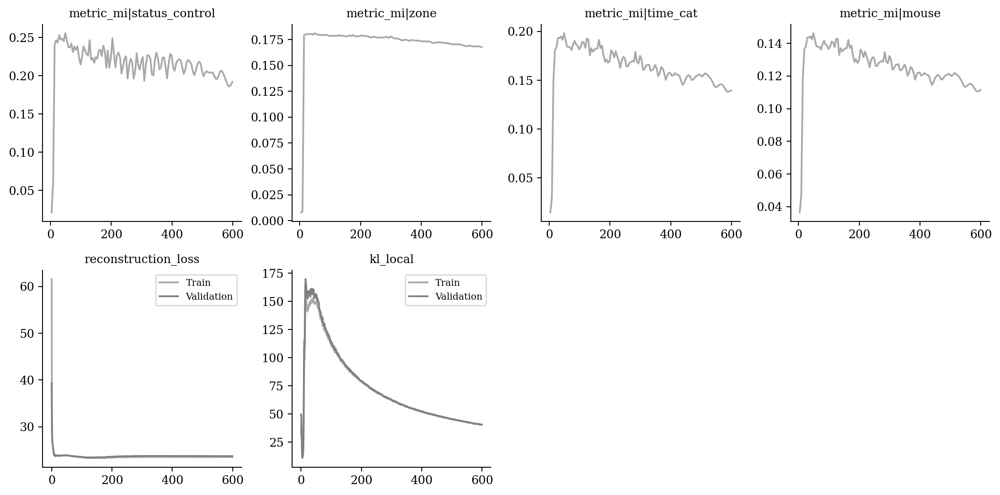

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

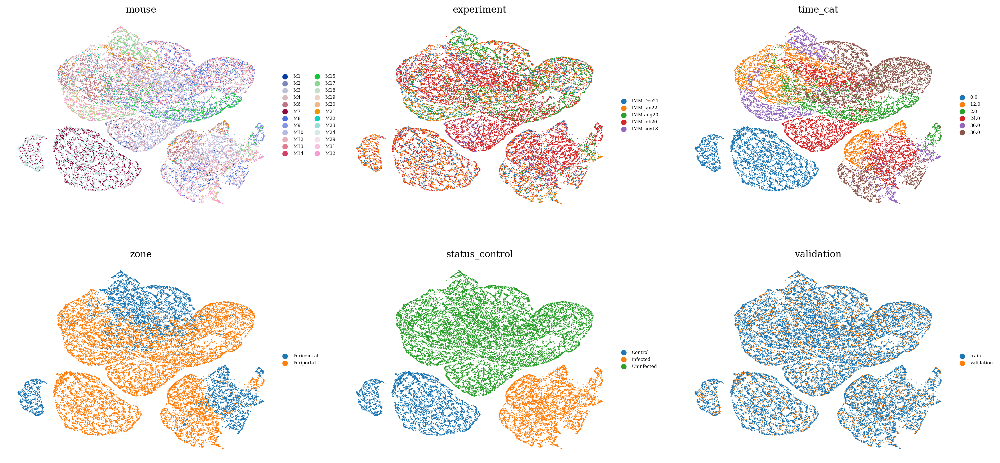

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

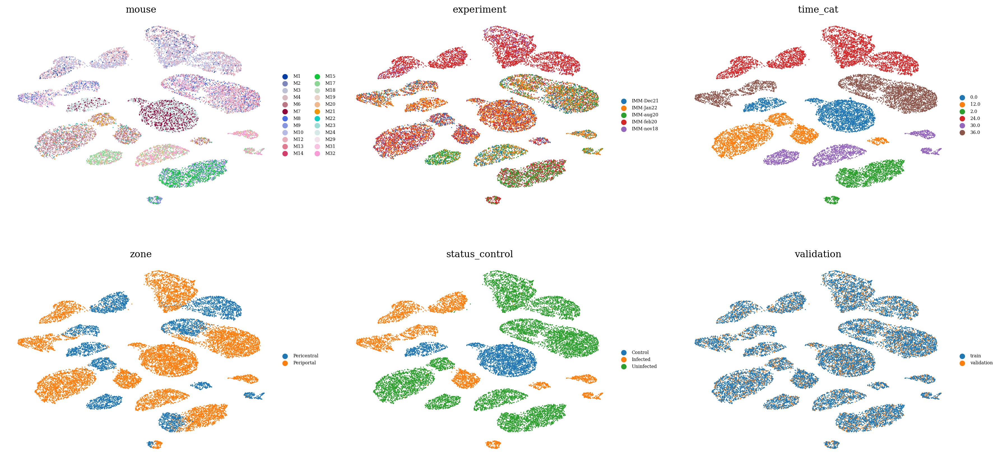

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

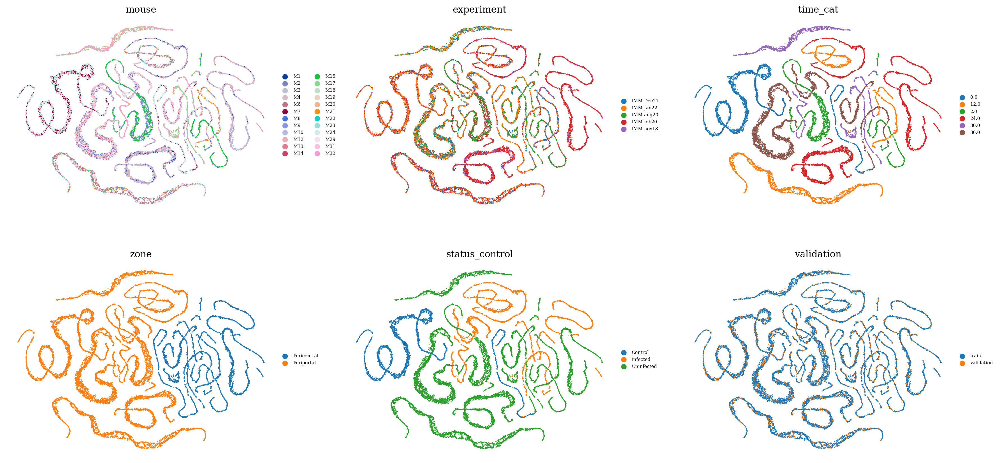

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

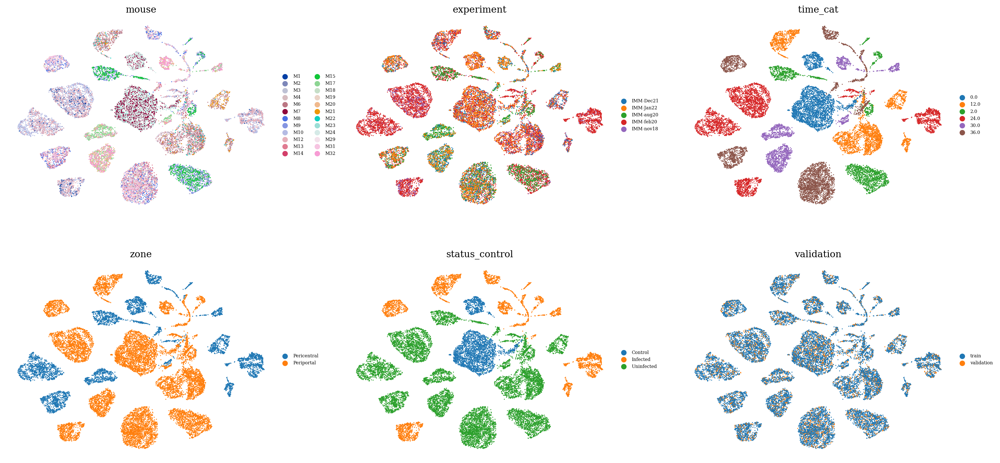

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

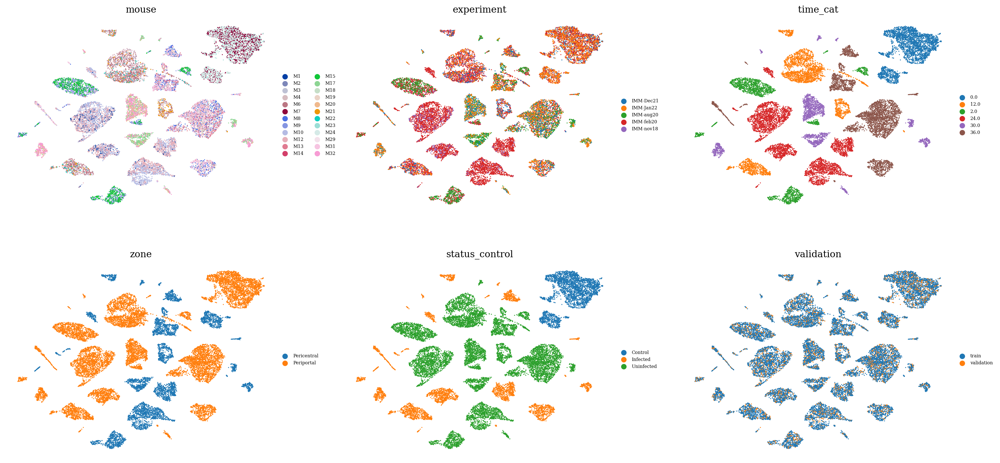

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.6540524709578736

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.6165525298918623

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9968294653876342,
 ('validation', 'unreserved'): 0.2587976208648325,
 ('train', 'reserved'): 0.9966293271031458,
 ('train', 'unreserved'): 0.21849629929704303}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9952321786709606,
 ('validation', 'unreserved'): 0.4435958577969322,
 ('train', 'reserved'): 0.9962167358207275,
 ('train', 'unreserved'): 0.39727047033123186}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9886415791046756,
 ('validation', 'unreserved'): 0.38965567088980585,
 ('train', 'reserved'): 0.9885985404372031,
 ('train', 'unreserved'): 0.32680978872919475}